Vous êtes Data Scientist au sein d'une société financière, nommée "Prêt à dépenser", qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt.  
L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus demandeurs de transparence vis-à-vis des décisions d’octroi de crédit. Cette demande de transparence des clients va tout à fait dans le sens des valeurs que l’entreprise veut incarner.

Prêt à dépenser décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement. 

<b>Votre mission</b>  
Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.  
Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.  
Mettre en production le modèle de scoring de prédiction à l’aide d’une API, ainsi que le dashboard interactif qui appelle l’API pour les prédictions.  
  
Michaël, votre manager, vous incite à sélectionner un ou des kernels Kaggle pour vous faciliter l’analyse exploratoire, la préparation des données et le feature engineering nécessaires à l’élaboration du modèle de scoring. Si vous le faites, vous devez analyser ce ou ces kernels et le ou les adapterpour vous assurer qu’ils répond(ent) aux besoins de votre mission.



<b>Spécifications du dashboard</b>  
Michaël vous a fourni des spécifications pour le dashboard interactif. Celui-ci devra contenir au minimum les fonctionnalités suivantes :

Permettre de visualiser le score et l’interprétation de ce score pour chaque client de façon intelligible pour une personne non experte en data science.  
Permettre de visualiser des informations descriptives relatives à un client (via un système de filtre).  
Permettre de comparer les informations descriptives relatives à un client à l’ensemble des clients ou à un groupe de clients similaires.  
<b>Spécifications techniques</b>  
Michaël vous propose d’utiliser Dash ou Bokeh ou Streamlit pour réaliser le Dahboard interactif.

Michaël souhaite également, afin de pouvoir faire évoluer régulièrement le modèle, tester la mise en oeuvre d’une démarche de type MLOps d’automatisation et d’industrialisation de la gestion du cycle de vie du modèle. Il vous envoie la liste d’outils à utiliser pour créer une plateforme MLOps qui s’appuie sur des outils Open Source. 

Michaël vous demande également de tester l’utilisation de la librairie evidently pour détecter dans le futur du Data Drift en production. Pour cela vous prendrez comme hypothèse que le dataset “application_train” représente les datas pour la modélisation et le dataset “application_test” représente les datas de nouveaux clients une fois le modèle en production. 

L’analyse à l’aide d’evidently vous permettra de détecter éventuellement du Data Drift sur les principales features, entre les datas d’entraînement et les datas de production, au travers du tableau HTML d’analyse que vous aurez réalisé.

Le déploiement de l'application dashboard et de l’API seront réalisées sur une plateforme Cloud, de préférence une solution gratuite, par exemple Azure webapp (ASP F1 gratuit), PythonAnywhere, Heroku avec le package “student” de Github ou tout autre solution.

D’autre part Michaël attend que vous mettiez en oeuvre une démarche d’élaboration des modèles avec Cross-Validation, via GridsearchCV ou équivalent.

Il vous donne un dernier conseil : si vous obtenez des scores supérieurs au 1er du challenge Kaggle (AUC > 0.82), posez-vous la question si vous n’avez pas de l’overfitting dans votre modèle.

Michaël attend également de votre part une note technique, présentant toute votre démarche d’élaboration du modèle jusqu’à l’analyse du Data Drift, afin de partager vos réalisations avec vos collègues. 

Spécifications contextuelles 
Michaël vous fait part de sa vigilance dans l’élaboration du modèle, concernant deux points spécifiques au contexte métier : 

Le déséquilibre entre le nombre de bons et de moins bons clients doit être pris en compte pour élaborer un modèle pertinent, à l’aide d’au moins une méthode au choix
Le déséquilibre du coût métier entre un faux négatif (FN - mauvais client prédit bon client : donc crédit accordé et perte en capital) et un faux positif (FP - bon client prédit mauvais : donc refus crédit et manque à gagner en marge)
Vous pourrez supposer, par exemple, que le coût d’un FN est dix fois supérieur au coût d’un FP
Vous créerez un score “métier” (minimisation du coût d’erreur de prédiction des FN et FP) pour comparer les modèles, afin de choisir le meilleur modèle et ses meilleurs hyperparamètres. Attention cette minimisation du coût métier doit passer par l’optimisation du seuil qui détermine, à partir d’une probabilité, la classe 0 ou 1 (un “predict” suppose un seuil à 0.5 qui n’est pas forcément l’optimum)
En parallèle, maintenez pour comparaison et contrôle des mesures plus techniques, telles que l’AUC et l’accuracy.

#### objectifs : 
-  créer un modèle de scoring personnalisé. Par exemple :   
(10*FN+FP)/N

# Exploration 

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sn

In [27]:
csv_files=os.listdir()
csv_files=[x for x in csv_files if x.endswith(".csv")]
csv_files

['application_test.csv',
 'application_train.csv',
 'bureau.csv',
 'bureau_balance.csv',
 'credit_card_balance.csv',
 'HomeCredit_columns_description.csv',
 'installments_payments.csv',
 'POS_CASH_balance.csv',
 'previous_application.csv',
 'sample_submission.csv']

In [18]:
# 10 bases de données à explorer

## 0) HomeCredit_columns_description

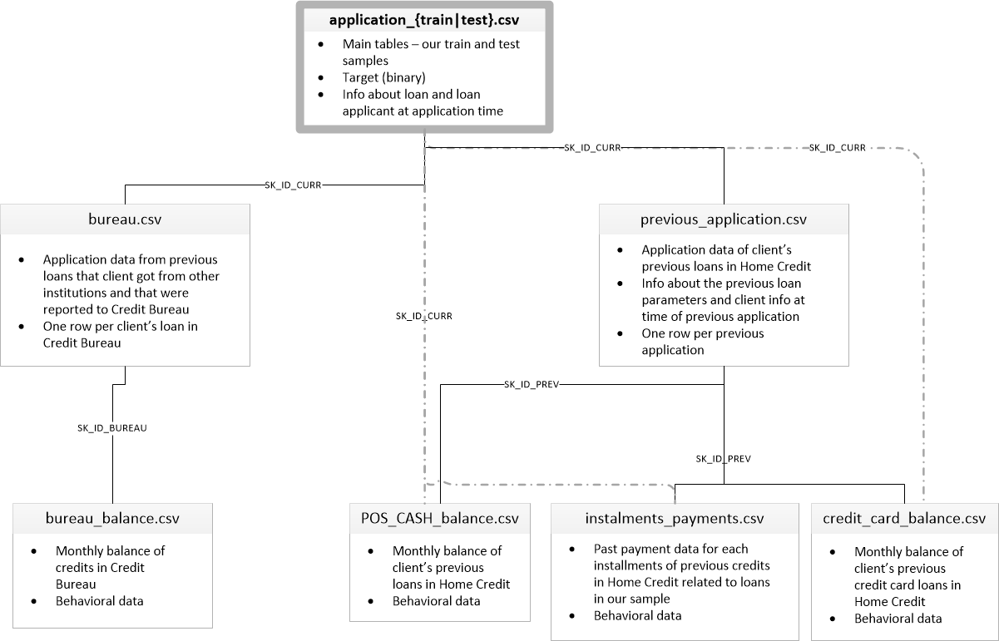

In [57]:
col_description=pd.read_csv("HomeCredit_columns_description.csv",encoding='ISO-8859-1',index_col=0)
col_description

,Table,Row,Description,Special
1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...
217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


In [51]:
col_description.loc[(col_description["Table"]=="application_{train|test}.csv")&(col_description["Row"]=="TARGET"),"Description"].values[0]

'Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)'

In [8]:
# description des variables des bases de données

In [58]:
col_description["Table"].value_counts()

application_{train|test}.csv    122
previous_application.csv         38
credit_card_balance.csv          23
bureau.csv                       17
POS_CASH_balance.csv              8
installments_payments.csv         8
bureau_balance.csv                3
Name: Table, dtype: int64

## 1) application_test / application_train

Dataset Description

<b>application_{train|test}.csv</b>  
This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
Static data for all applications. One row represents one loan in our data sample.

In [15]:
# récupération des descriptions des variables associées
description=col_description.loc[col_description.Table=="application_{train|test}.csv","Description"]
description[:50]

0                              ID of loan in our sample
1     Target variable (1 - client with payment diffi...
2           Identification if loan is cash or revolving
3                                  Gender of the client
4                         Flag if the client owns a car
5                   Flag if client owns a house or flat
6                     Number of children the client has
7                                  Income of the client
8                             Credit amount of the loan
9                                          Loan annuity
10    For consumer loans it is the price of the good...
11    Who was accompanying client when he was applyi...
12    Clients income type (businessman, working, mat...
13       Level of highest education the client achieved
14                          Family status of the client
15    What is the housing situation of the client (r...
16    Normalized population of region where client l...
17      Client's age in days at the time of appl

In [16]:
description[-50:]

72     Normalized information about building where th...
73     Normalized information about building where th...
74     Normalized information about building where th...
75     Normalized information about building where th...
76     Normalized information about building where th...
77     Normalized information about building where th...
78     Normalized information about building where th...
79     Normalized information about building where th...
80     Normalized information about building where th...
81     Normalized information about building where th...
82     Normalized information about building where th...
83     Normalized information about building where th...
84     Normalized information about building where th...
85     Normalized information about building where th...
86     Normalized information about building where th...
87     Normalized information about building where th...
88     Normalized information about building where th...
89     Normalized information a

In [321]:
application_test=pd.read_csv("./data/application_test.csv")
application_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.00,568800.00,20560.50,450000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
1,100005,Cash loans,M,N,Y,0,99000.00,222768.00,17370.00,180000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,3.00
2,100013,Cash loans,M,Y,Y,0,202500.00,663264.00,69777.00,630000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,1.00,4.00
3,100028,Cash loans,F,N,Y,2,315000.00,1575000.00,49018.50,1575000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,3.00
4,100038,Cash loans,M,Y,N,1,180000.00,625500.00,32067.00,625500.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.00,412560.00,17473.50,270000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
48740,456222,Cash loans,F,N,N,2,157500.00,622413.00,31909.50,495000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.00,315000.00,33205.50,315000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,3.00,1.00
48742,456224,Cash loans,M,N,N,0,225000.00,450000.00,25128.00,450000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,2.00


In [327]:
application_train=pd.read_csv('./data/application_train.csv')
application_train=application_train.drop("SK_ID_CURR",axis=1)
application_train

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
3,0,Cash loans,F,N,Y,0,135000.00,312682.50,29686.50,297000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,0,Cash loans,M,N,Y,0,121500.00,513000.00,21865.50,513000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,Cash loans,M,N,N,0,157500.00,254700.00,27558.00,225000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,0,Cash loans,F,N,Y,0,72000.00,269550.00,12001.50,225000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,0,Cash loans,F,N,Y,0,153000.00,677664.00,29979.00,585000.00,...,0,0,0,0,1.00,0.00,0.00,1.00,0.00,1.00
307509,1,Cash loans,F,N,Y,0,171000.00,370107.00,20205.00,319500.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00


In [9]:
application_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 121 entries, TARGET to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 283.9+ MB


In [10]:
application_train.describe()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [8]:
col=application_train.columns
col[:50]

Index(['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'APARTMENTS_AVG', 'B

 un dataset contenant un grand nombre de variables, chaque ligne est un client, il faudra déterminer où sont les output. Il y a des valeurs manquantes

La prédiction est la probabilité de faillite d'un client de façon automatique

## Valeurs uniques pour chaque variable

In [163]:
val_unique.dtypes

dtype('int64')

In [147]:
val_unique=application_train.nunique()

In [166]:
colors={'int64':'green','float64':'blue','object':'red'}

In [9]:
# Conversion des types de données en chaînes de caractères
val_types = [str(d) for d in application_train.dtypes]


C:\Users\hugo\AppData\Local\Temp\ipykernel_15292\3576060687.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(float_vals.index, rotation=77,fontsize=12)


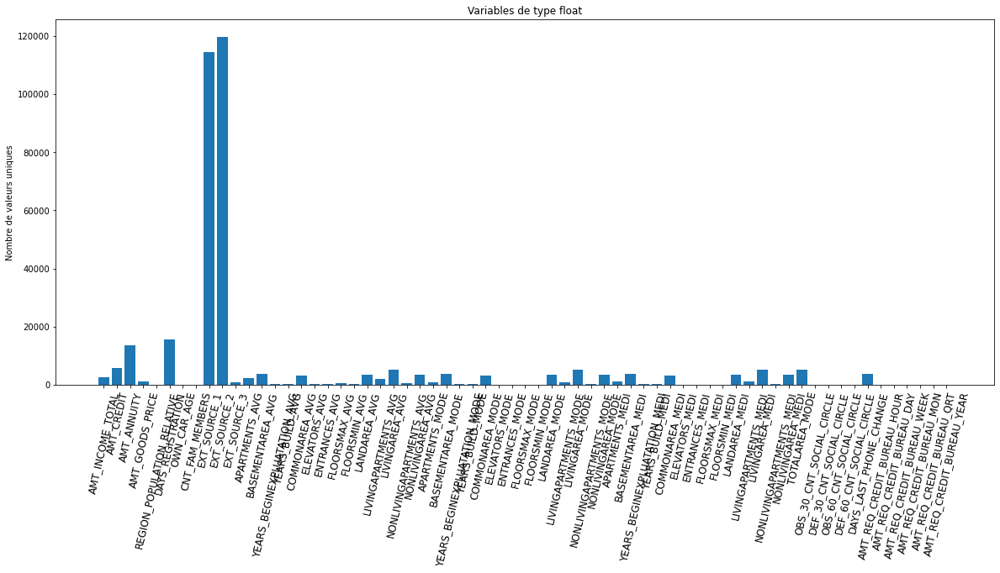

In [11]:

# Filtrage des variables par type de données
float_cols = [col for col in application_train.columns if application_train[col].dtype == 'float64']
int_cols = [col for col in application_train.columns if application_train[col].dtype == 'int64']
obj_cols = [col for col in application_train.columns if application_train[col].dtype == 'object']

# Création du graphique pour les variables de type float
float_vals = application_train[float_cols].nunique()
fig, ax = plt.subplots(figsize=(20, 8))
ax.bar(float_vals.index, float_vals.values)
ax.set_xticklabels(float_vals.index, rotation=77,fontsize=12)
ax.set_ylabel('Nombre de valeurs uniques')
ax.set_title('Variables de type float')

plt.show()


In [14]:
obj_cols

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [15]:
int_cols

['TARGET',
 'CNT_CHILDREN',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']

In [16]:
float_cols

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_M

C:\Users\hugo\AppData\Local\Temp\ipykernel_15292\3243922900.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(int_vals.index, rotation=77,fontsize=12)


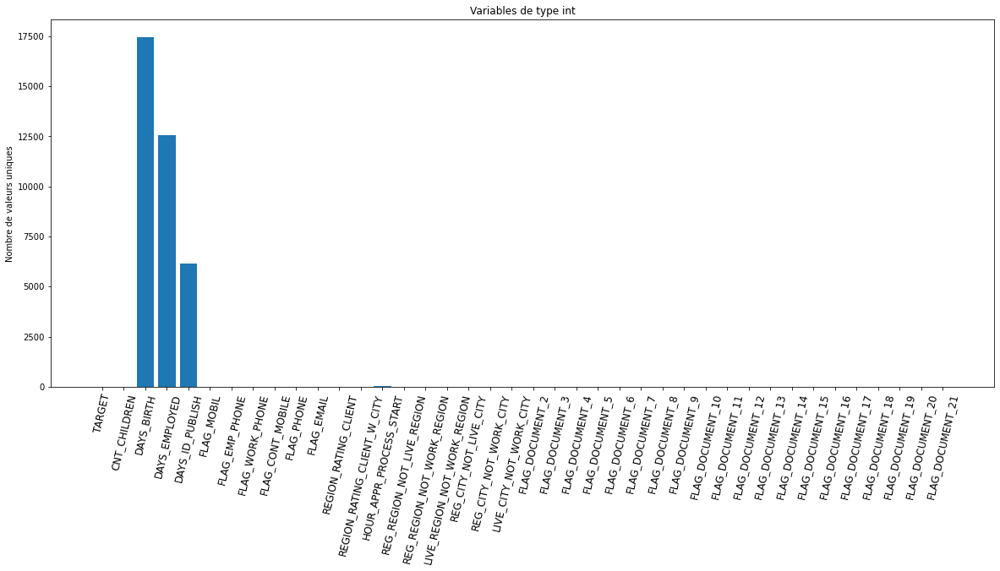

In [17]:
# Création du graphique du nombre de valeurs uniques pour les variables de type float
int_vals = application_train[int_cols].nunique()
fig, ax = plt.subplots(figsize=(20, 8))
ax.bar(int_vals.index, int_vals.values)
ax.set_xticklabels(int_vals.index, rotation=77,fontsize=12)
ax.set_ylabel('Nombre de valeurs uniques')
ax.set_title('Variables de type int')

plt.show()

In [181]:
# Semble correct

C:\Users\hugo\AppData\Local\Temp\ipykernel_472\4165641601.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(obj_vals.index, rotation=77,fontsize=12)


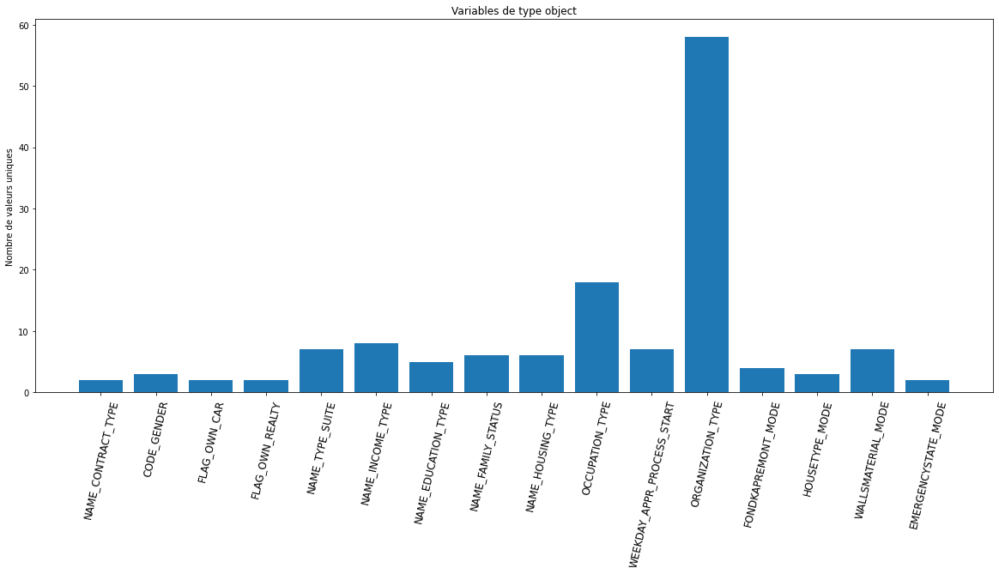

In [187]:
# Création du graphique pour les variables de type float
obj_vals = application_train[obj_cols].nunique()
fig, ax = plt.subplots(figsize=(20, 8))
ax.bar(obj_vals.index, obj_vals.values)
ax.set_xticklabels(obj_vals.index, rotation=77,fontsize=12)
ax.set_ylabel('Nombre de valeurs uniques')
ax.set_title('Variables de type object')

plt.show()

In [ ]:
# regardons si ce sont bien toutes des variables de type obj

## Valeurs aberrantes

### variables int

In [189]:
application_train[int_cols].describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,-16036.995067,63815.045904,-2994.202373,0.999997,0.819889,0.199368,0.998133,...,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335
std,102790.175348,0.272419,0.722121,4363.988632,141275.766519,1509.450419,0.001803,0.384280,0.399526,0.043164,...,0.002550,0.059268,0.054110,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299
min,100002.000000,0.000000,0.000000,-25229.000000,-17912.000000,-7197.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,-19682.000000,-2760.000000,-4299.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,-15750.000000,-1213.000000,-3254.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,367142.500000,0.000000,1.000000,-12413.000000,-289.000000,-1720.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,456255.000000,1.000000,19.000000,-7489.000000,365243.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### variables float

In [188]:
application_train[float_cols].describe()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,OWN_CAR_AGE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,104582.000000,307509.000000,134133.000000,3.068510e+05,...,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-4986.120328,12.061091,2.152665,0.502130,5.143927e-01,...,0.143421,1.405292,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,3522.886321,11.944812,0.910682,0.211062,1.910602e-01,...,0.446698,2.379803,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-24672.000000,0.000000,1.000000,0.014568,8.173617e-08,...,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-7479.500000,5.000000,2.000000,0.334007,3.924574e-01,...,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-4504.000000,9.000000,2.000000,0.505998,5.659614e-01,...,0.000000,0.000000,0.000000,-757.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-2010.000000,15.000000,3.000000,0.675053,6.636171e-01,...,0.000000,2.000000,0.000000,-274.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,0.000000,91.000000,20.000000,0.962693,8.549997e-01,...,34.000000,344.000000,24.000000,0.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [ ]:
# rien d'anormal à prioiri

### variables obj

In [190]:
application_train[obj_cols].describe()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


## Doublons

In [268]:
application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [269]:
duplicates = application_train[application_train.duplicated(subset=["SK_ID_CURR"], keep=False)]
duplicates

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [270]:
# pas de doublons

## Valeurs manquantes

In [5]:
application_train[int_cols].isna().sum()

SK_ID_CURR                     0
TARGET                         0
CNT_CHILDREN                   0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
REG_CITY_NOT_WORK_CITY         0
LIVE_CITY_NOT_WORK_CITY        0
FLAG_DOCUMENT_2                0
FLAG_DOCUMENT_3                0
FLAG_DOCUMENT_4                0
FLAG_DOCUMENT_5                0
FLAG_DOCUMENT_6                0
FLAG_DOCUMENT_7                0
FLAG_DOCUMENT_8                0
FLAG_DOCUMENT_9                0
FLAG_DOCUMENT_10               0
FLAG_DOCUM

In [ ]:
# pas de valeurs manquantes pour les entiers

In [40]:
float_na=application_train[float_cols].isna().sum()

In [32]:
obj_na=application_train[obj_cols].isna().sum()

In [41]:
n=application_train.shape[0]

# affichons les variables qui ont plus de 1% de valeurs manquantes pour float
float_na_pct=float_na*100/n
cols_na=float_na.index

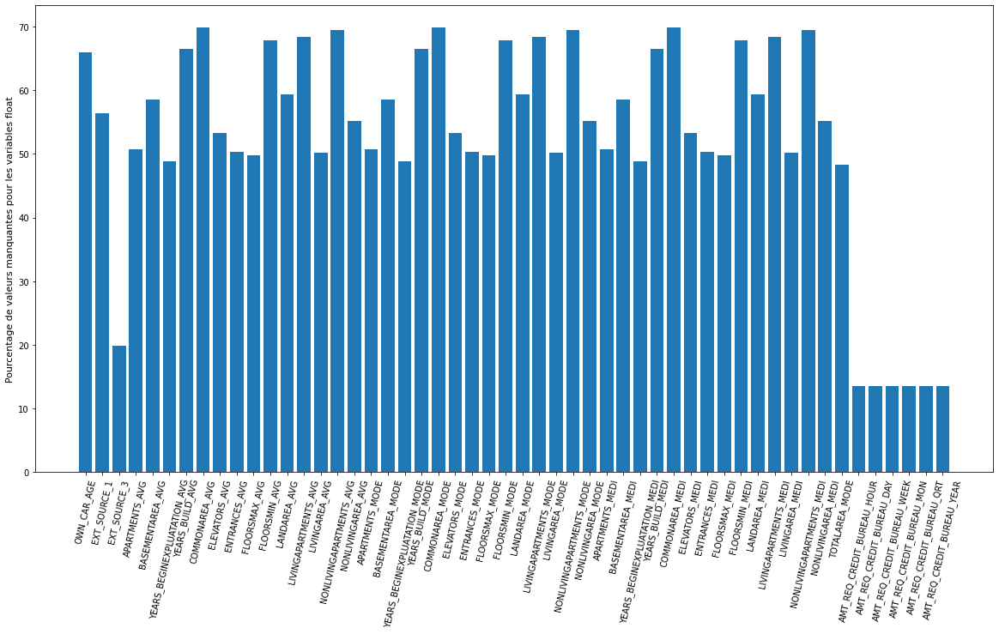

In [27]:
plt.figure(figsize=(20,10))
plt.bar(float_na_pct.index,float_na_pct.values)
plt.ylabel("Pourcentage de valeurs manquantes pour les variables float",fontsize=11)

plt.xticks(rotation=77)
plt.show()

In [34]:
# affichons les variables qui ont plus de 1% de valeurs manquantes pour obj
obj_na_pct=obj_na*100/n
cols_na=obj_na.index

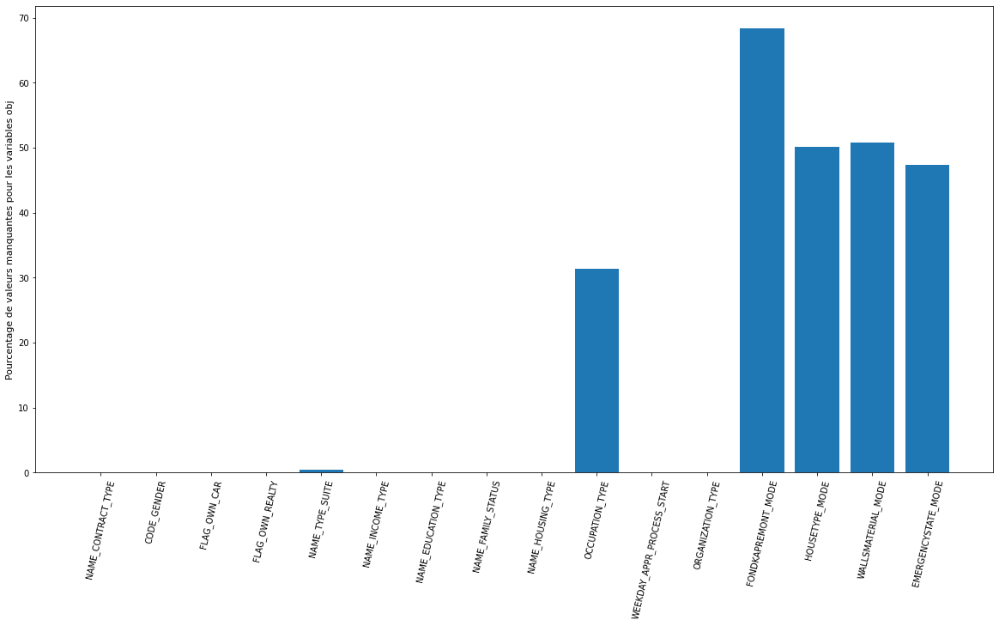

In [35]:
plt.figure(figsize=(20,10))
plt.bar(obj_na_pct.index,obj_na_pct.values)
plt.ylabel("Pourcentage de valeurs manquantes pour les variables obj",fontsize=11)
plt.xticks(rotation=77)
plt.show()

In [222]:
# énormément de valeurs manquantes pour les variables de type obj, nous ne pouvons pas ne pas toutes les jeter
# nous n'aurions plus qu'un DF avec 8602 entrées
application_train.dropna().shape

(8602, 122)

In [223]:
# Il va donc falloir imputer des valeurs ou ne pas garder certaines variables

In [44]:
application_train.TARGET.value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

## Suppression des variables avec le plus de NaN

In [21]:
application_train.shape

(307511, 121)

In [ ]:
# # D'abord, il faudrait faire une pré-sélection des variables qui on le plus de NA puisqu'il est clair qu'une imputation
# # sera plus arbitraire pour une variable ayant peu de valeurs. Il faudrait tester plusieurs seuils.

# def seuil_na(df, seuil=60):
#     df_tmp=df.copy()
#     """
#     Supprime les colonnes ayant un pourcentage de valeurs manquantes supérieur ou égal à un seuil donné.

#     Parameters:
#         df (DataFrame): dataFrame à traiter.
#         seuil (float): le seuil de pourcentage de valeurs manquantes à partir duquel une colonne sera supprimée (60 par défaut).

#     Returns:
#         df (DataFrame): le DataFrame modifié, sans les colonnes ayant un pourcentage de valeurs manquantes supérieur ou égal au seuil.
#     """
#     # Calculer le pourcentage de valeurs manquantes par colonne
#     tmp_na = df.isna().sum()
#     tmp_na = tmp_na / df.shape[0] * 100
#     # Filtrer les colonnes ayant un pourcentage de valeurs manquantes supérieur ou égal au seuil
#     cols_na = tmp_na[tmp_na >= seuil].index
#     # Supprimer les colonnes concernées du DataFrame
#     df_tmp = df_tmp.drop(cols_na, axis=1)
#     return df_tmp

In [301]:
# par défaut on récupérer un dataframe dont les variables ont moins
# de 60% de valeurs manquantes
data=seuil_na(application_train,seuil=80)

In [302]:
data.isna().sum().sum()

9152465

In [303]:
data.shape

(307511, 121)

In [328]:
data=application_train.copy()

## Analyse univariée/multivariée

### Visualisation rapide de la distribution des variables numériques

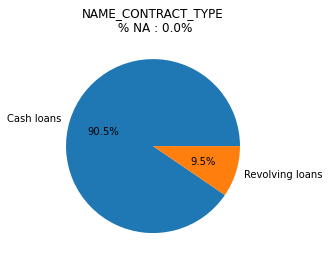

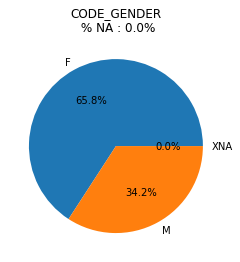

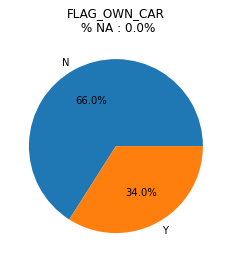

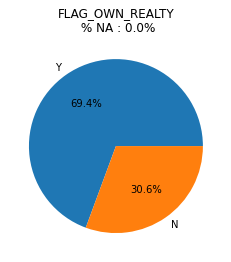

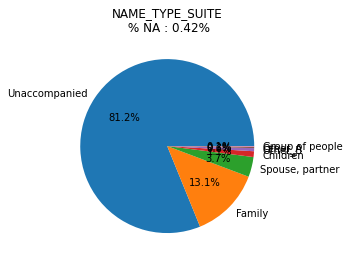

...

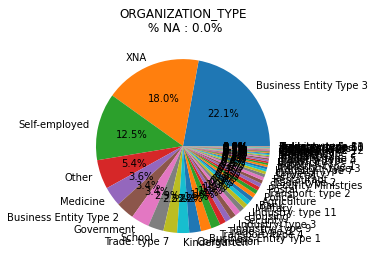

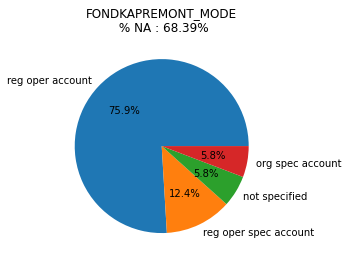

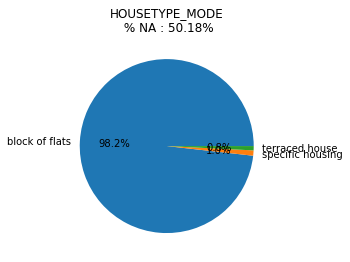

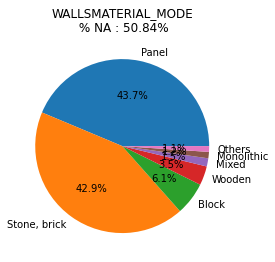

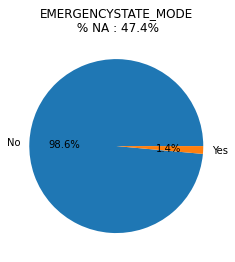

In [36]:
# Regardons ces variables de plus près d'abord pour les variables obj
for var in obj_cols:
    # Calcul des fréquences
    freq = application_train[var].value_counts()
    
    # Création du pieplot
    fig, ax = plt.subplots()
    ax.pie(freq.values, labels=freq.index, autopct='%1.1f%%')
    ax.set_title(var+"\n % NA : "+str(obj_na_pct[var].round(2))+"%" )

    
    # Affichage du pieplot
    plt.show()

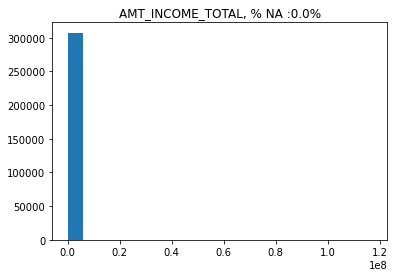

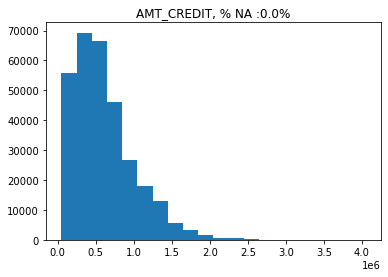

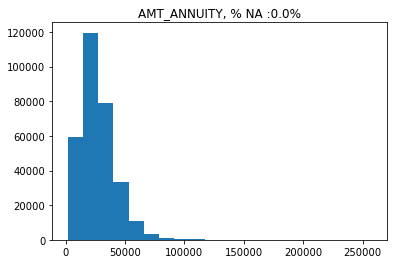

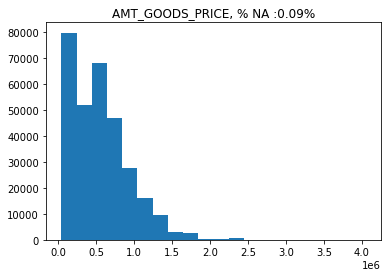

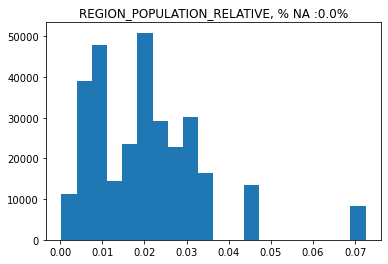

...

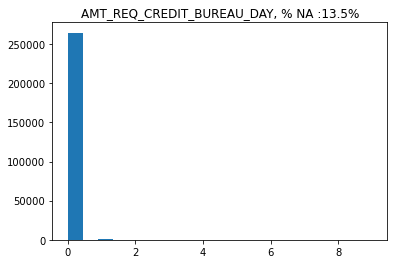

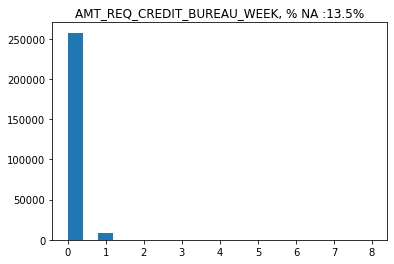

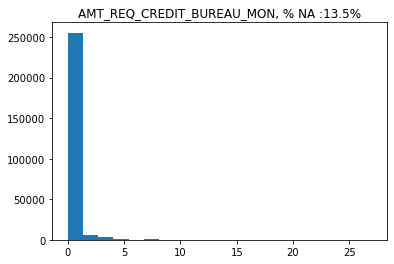

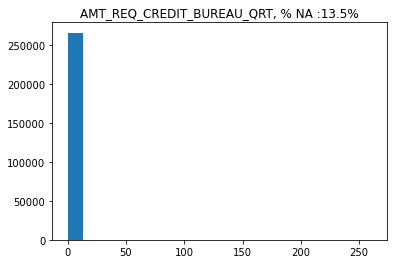

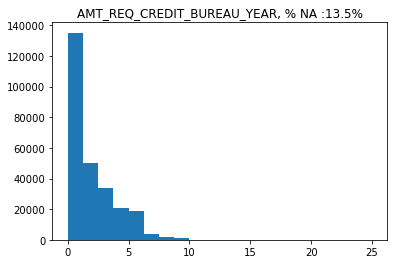

In [42]:
for var in float_cols:
    # création de plusieurs histogrammes
    fig,ax=plt.subplots()
    ax.hist(application_train[var],bins=20)
    ax.set_title(var+", % NA :"+str(float_na_pct[var].round(2))+"%" )
    plt.show()

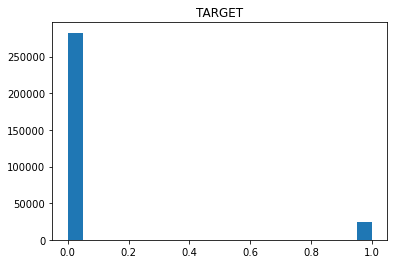

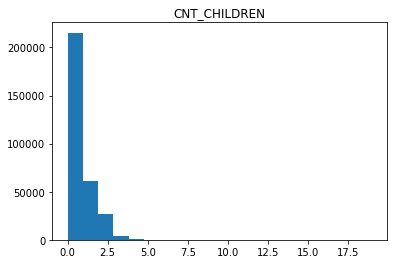

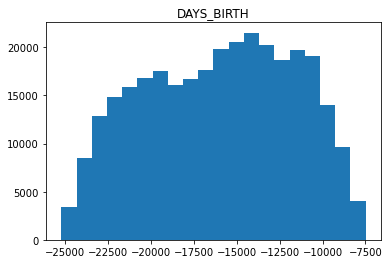

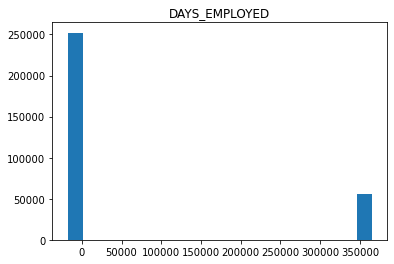

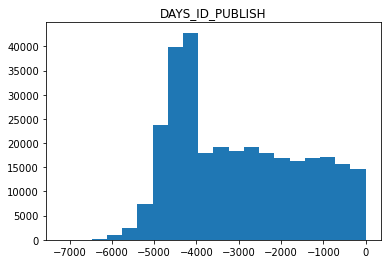

...

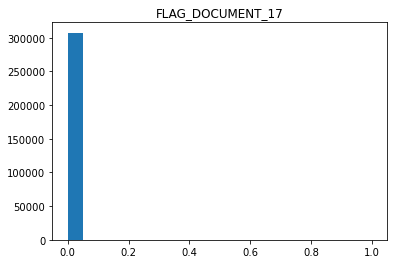

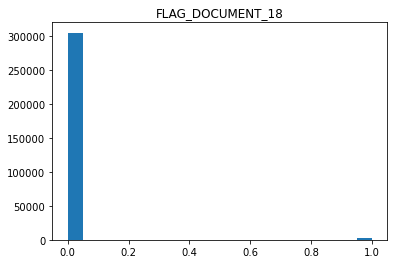

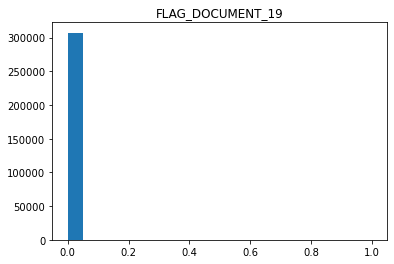

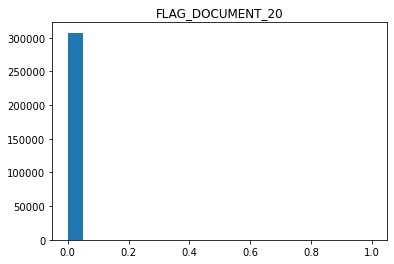

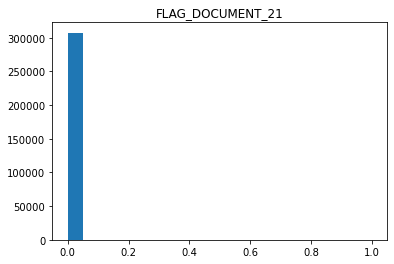

In [50]:
for var in int_cols:
       # création de plusieurs histogrammes
    fig,ax=plt.subplots()
    ax.hist(application_train[var],bins=20)
    ax.set_title(var )
    plt.show()

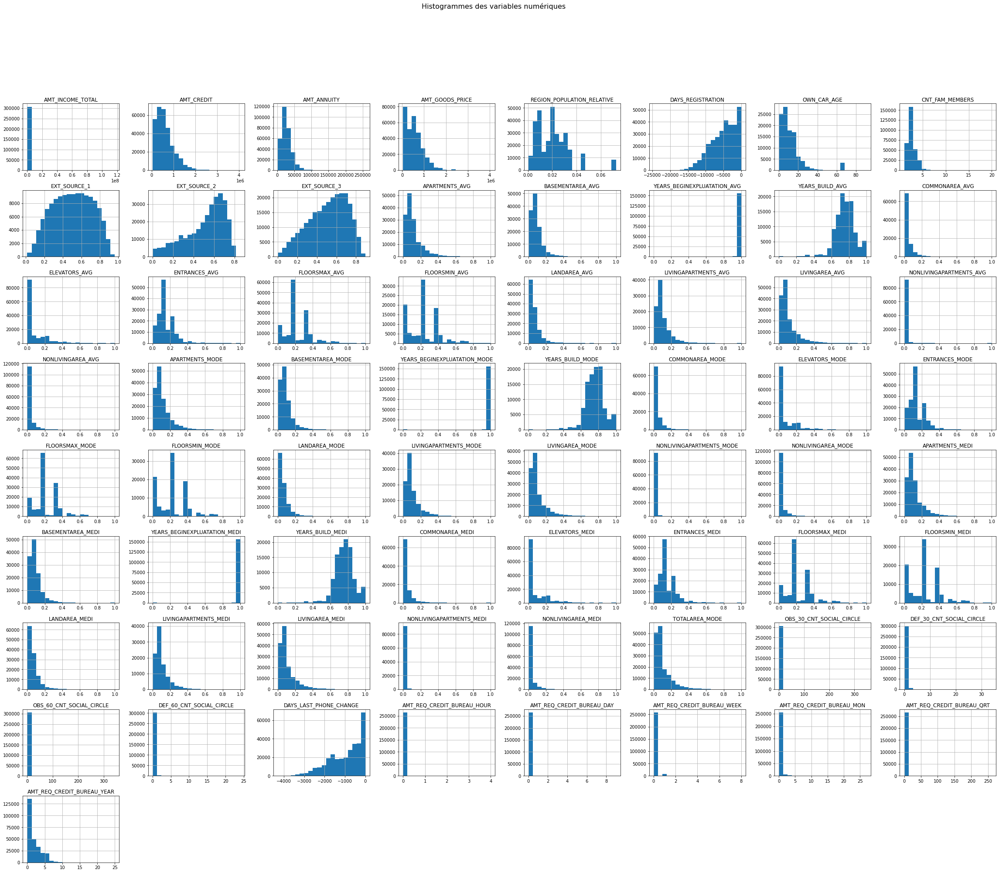

In [70]:
# Créer une figure plus grande
fig, axes = plt.subplots(figsize=(40,32))

# Tracer l'histogramme des variables numériques sur la figure
application_train[float_cols].hist(ax=axes,bins=20)

# Ajouter un titre à la figure
fig.suptitle('Histogrammes des variables numériques', fontsize=22)

# Afficher la figure
plt.show()

In [71]:
# un passage au log pour certaines de ces variables pourraient être utile

In [78]:
description_data=col_description.loc[col_description.Table=="application_{train|test}.csv",["Row","Description"]]

In [81]:
# affichage des descriptions 
for col in application_train.columns:
    print (col)
    print ("description : "+description_data.loc[description_data.Row==col,"Description"].values[0])

SK_ID_CURR
description : ID of loan in our sample
TARGET
description : Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)
NAME_CONTRACT_TYPE
description : Identification if loan is cash or revolving
CODE_GENDER
description : Gender of the client
FLAG_OWN_CAR
description : Flag if the client owns a car
FLAG_OWN_REALTY
description : Flag if client owns a house or flat
CNT_CHILDREN
description : Number of children the client has
AMT_INCOME_TOTAL
description : Income of the client
AMT_CREDIT
description : Credit amount of the loan
AMT_ANNUITY
description : Loan annuity
AMT_GOODS_PRICE
description : For consumer loans it is the price of the goods for which the loan is given
NAME_TYPE_SUITE
description : Who was accompanying client when he was applying for the loan
NAME_INCOME_TYPE
description : Clients income type (businessman, working, maternity leave,)


Nous allons choisir certaines de ces variables et les analyser

In [116]:
application_train.DAYS_EMPLOYED.value_counts()

 365243    55374
-200         156
-224         152
-230         151
-199         151
           ...  
-13961         1
-11827         1
-10176         1
-9459          1
-8694          1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

## Analyse de corrélation

In [312]:
num_cols=num_cols+["TARGET"]

In [313]:
mat_corr=application_train[num_cols].corr()

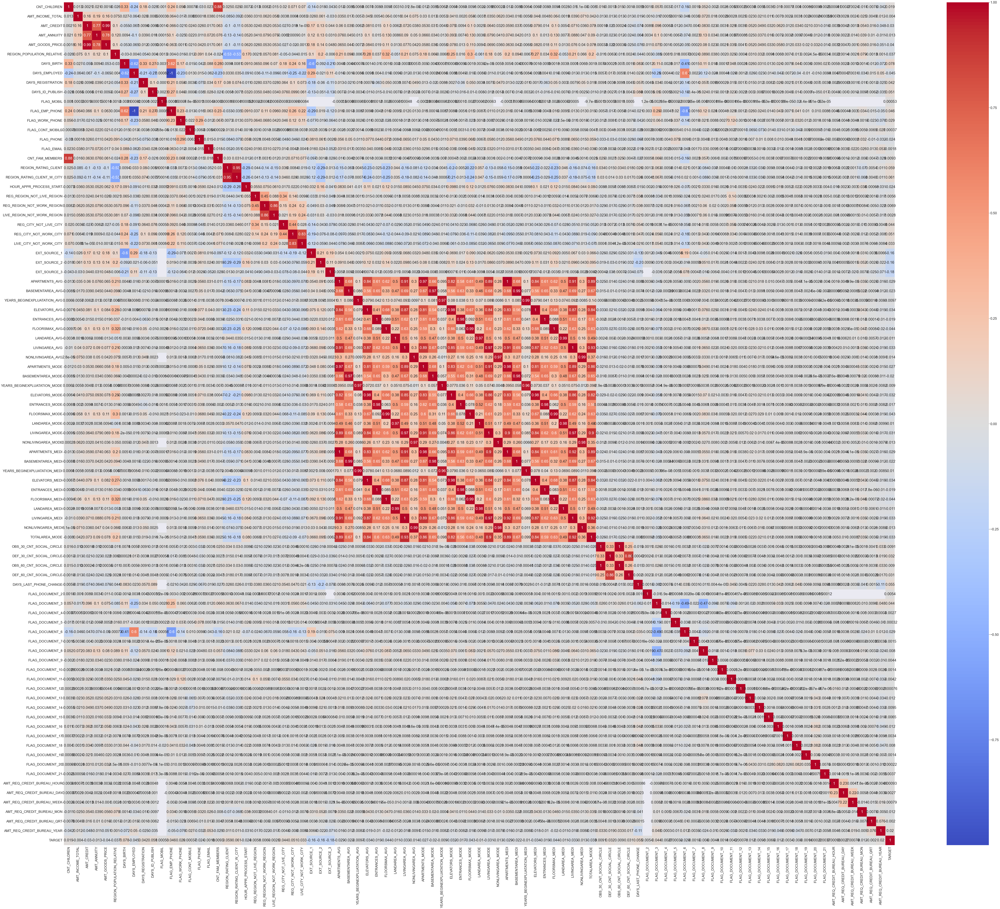

In [314]:
import seaborn as sn
plt.figure(figsize=(120, 100))
sn.heatmap(mat_corr, annot=True, cmap="coolwarm")
plt.show()


## Ingestion des données

In [329]:
data.shape

(307511, 121)

In [330]:
data.TARGET.value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

In [331]:
data

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
3,0,Cash loans,F,N,Y,0,135000.00,312682.50,29686.50,297000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,0,Cash loans,M,N,Y,0,121500.00,513000.00,21865.50,513000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,Cash loans,M,N,N,0,157500.00,254700.00,27558.00,225000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,0,Cash loans,F,N,Y,0,72000.00,269550.00,12001.50,225000.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,0,Cash loans,F,N,Y,0,153000.00,677664.00,29979.00,585000.00,...,0,0,0,0,1.00,0.00,0.00,1.00,0.00,1.00
307509,1,Cash loans,F,N,Y,0,171000.00,370107.00,20205.00,319500.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00


In [332]:
# gestion du déséquilibre de classe
X_1=data[data["TARGET"]==1]
X_0=data[data["TARGET"]==0]
X_0=X_0.sample(n=X_1.shape[0])
X= pd.concat([X_0, X_1]).sample(frac=1).reset_index(drop=True)



In [333]:
X

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,Revolving loans,M,Y,Y,2,112500.00,270000.00,13500.00,270000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,1.00,0.00
1,1,Cash loans,F,N,Y,1,90000.00,755190.00,36459.00,675000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,7.00
2,1,Revolving loans,F,N,Y,1,247500.00,180000.00,9000.00,180000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,2.00,2.00
3,1,Cash loans,M,N,Y,2,180000.00,629325.00,27850.50,562500.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,7.00
4,0,Cash loans,F,N,Y,0,67500.00,364896.00,26550.00,315000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49645,1,Cash loans,F,N,Y,0,315000.00,1113840.00,57001.50,900000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,2.00
49646,0,Cash loans,F,Y,Y,0,34650.00,99000.00,10791.00,99000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,1.00,0.00
49647,0,Revolving loans,M,Y,Y,0,135000.00,180000.00,9000.00,180000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,2.00,2.00
49648,1,Cash loans,M,N,Y,1,270000.00,1078200.00,29781.00,900000.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,4.00


In [334]:
seed=64

from sklearn.model_selection import train_test_split

train,test=train_test_split(X,test_size=0.3,random_state=seed,stratify=X.TARGET)
test,validation=train_test_split(test,test_size=0.5,random_state=seed,stratify=test.TARGET)

In [335]:
train.shape,validation.shape,test.shape

((34755, 121), (7448, 121), (7447, 121))

In [286]:
# ingestion des données 
# enregistrement des différents ensembles de données
# train.to_csv("./data/train.csv",index=False)
# test.to_csv("./data/test.csv",index=False)
# validation.to_csv("./data/validation.csv",index=False)

#chargement des différents ensembles de données
train=pd.read_csv("./data/train.csv")
test=pd.read_csv("./data/test.csv")
validation=pd.read_csv("./data/validation.csv")


In [336]:
print("train data",train.shape)
print("test data",test.shape)
print("validation data",validation.shape)

train data (34755, 121)
test data (7447, 121)
validation data (7448, 121)


## Imputation

In [337]:
num_cols=data.select_dtypes(exclude=["object"]).columns.tolist()
num_cols=[col for col in num_cols if col!="TARGET"]
num_cols

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXP

In [338]:
cat_cols=data.select_dtypes(include=["object"]).columns.tolist()
cat_cols

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [17]:
## par la médiane, moyenne, valeurs la plus fréquente, par mode...

In [339]:
from sklearn.impute import SimpleImputer


# La fonction prend un DataFrame et un indicateur booléen most_frequent qui indique si l'on
#veut utiliser la stratégie "most_frequent" de SimpleImputer 
# ou par la chaîne "Unknown"

def fill_cat(df, most_frequent=False):
    df_tmp=df.copy()
    
    # Sélection des colonnes catégorielles dans le DataFrame
    cols = [col for col in df.columns if df[col].dtype == 'object']

    #  remplir les na dans chaque colonne catégorielle avec la valeur la plus fréquente
    if most_frequent: 
        imputer = SimpleImputer(strategy='most_frequent')
        # Appliquer la méthode fit_transform de SimpleImputer 
        # et remplacer les valeurs manquantes par la valeur la plus fréquente
        df_tmp[cols] = imputer.fit_transform(df_tmp[cols])
    # Sinon, remplir les na dans chaque colonne catégorielle avec "Unknown"
    else:
        
        df_tmp[cols] = df_tmp[cols].fillna("Unknown")

    return df_tmp.values

In [340]:
def fill_num(df,strategy="median"):
    df_tmp=df.copy()
    imputer=SimpleImputer(strategy=strategy)
    cols=[col for col in df.columns if df[col].dtype=="float64"]
    df_tmp[cols]=imputer.fit_transform(df_tmp[cols])
    return df_tmp.values

HOUSETYPE_MODE NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR CNT_CHILDREN  
AMT_INCOME_TOTAL AMT_CREDIT NAME_INCOME_TYPE NAME_EDUCATION_TYPE NAME_FAMILY_STATUS
NAME_HOUSING_TYPE DAYS_BIRTH OCCUPATION_TYPE

In [341]:
import gc
gc.collect()

20668

In [342]:
from sklearn import set_config

# Set the display configuration for the pipeline
set_config(display='diagram')

In [343]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,FunctionTransformer
from category_encoders import TargetEncoder
from sklearn.preprocessing import OneHotEncoder



num_transformer=Pipeline(steps=[("num_imputer",FunctionTransformer(func=fill_num,kw_args={"strategy":"mean"})),
                                ("scaler",StandardScaler())])
cat_transformer=Pipeline(steps=[("cat_imputer",FunctionTransformer(func=fill_cat,kw_args={"most_frequent":False})),
                                 ("encoder",TargetEncoder())])

preprocessor=ColumnTransformer(
transformers=[
    ("num",num_transformer,num_cols),
    ("cat",cat_transformer,cat_cols)
])



In [ ]:
# ####S'agissant du random_search, essayer d'implémenter ça avec les fonctions

# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import FunctionTransformer
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import GridSearchCV

# # Créer une instance de ColumnTransformer avec une fonction transformateur
# ct = ColumnTransformer(
#     transformers=[
#         ('transform', FunctionTransformer(), ['col1', 'col2'])
#     ],
#     # Ajouter les hyperparamètres de la fonction transformateur pour chaque colonne traitée
#     transformer_params={
#         'transform__func': [{
#             'param1': value1,
#             'param2': value2,
#         }, {
#             'param1': value3,
#             'param2': value4,
#         }]
#     }
# )

# # Créer un pipeline avec le ColumnTransformer et l'estimateur final
# pipe = Pipeline([
#     ('preprocess', ct),
#     ('model', estimator)
# ])

# # Définir la grille de recherche pour chaque hyperparamètre de la fonction transformateur
# param_grid = {
#     'preprocess__transform__func__param1': [value1, value2],
#     'preprocess__transform__func__param2': [value3, value4]
# }

# # Créer une instance de GridSearchCV
# grid_search = GridSearchCV(pipe, param_grid, cv=5)

# # Exécuter la recherche de grille
# grid_search.fit(X, y)

# # Obtenir les meilleurs hyperparamètres trouvés
# best_params = grid_search.best_params_


In [344]:
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('num_imputer',
                                                  FunctionTransformer(func=<function fill_num at 0x000001EBD8641040>,
                                                                      kw_args={'strategy': 'mean'})),
                                                 ('scaler', StandardScaler())]),
                                 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE',
                                  'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION...
                                                 ('encoder', TargetEncoder())]),
                                 ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                  'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                                  'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                  'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                  'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                  'WEEKDAY_APPR_PROCESS_START',
                                  'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
                                  'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
                                  'EMERGENCYSTATE_MODE'])])

In [345]:
from sklearn.model_selection import train_test_split

X_train,y_train=train.iloc[:,1:],train.iloc[:,0]
X_val,y_val=validation.iloc[:,1:],validation.iloc[:,0]


In [346]:
y_train

41744    0
32653    1
31566    0
33681    1
40798    0
        ..
22956    0
37762    1
1805     1
46318    1
6889     0
Name: TARGET, Length: 34755, dtype: int64

In [177]:
X_train_transformed=preprocessor.fit_transform(X_train,y_train)
X_val_transformed=preprocessor.transform(X_val)

In [298]:
X_train.isna().sum().sum()

665384

In [299]:
np.isnan(X_train_transformed).sum()

0

In [145]:
import lazypredict
from lazypredict.Supervised import LazyClassifier

classifieurs=lazypredict.Supervised.CLASSIFIERS
classifieurs

[('AdaBoostClassifier', sklearn.ensemble._weight_boosting.AdaBoostClassifier),
 ('BaggingClassifier', sklearn.ensemble._bagging.BaggingClassifier),
 ('BernoulliNB', sklearn.naive_bayes.BernoulliNB),
 ('CalibratedClassifierCV', sklearn.calibration.CalibratedClassifierCV),
 ('CategoricalNB', sklearn.naive_bayes.CategoricalNB),
 ('DecisionTreeClassifier', sklearn.tree._classes.DecisionTreeClassifier),
 ('DummyClassifier', sklearn.dummy.DummyClassifier),
 ('ExtraTreeClassifier', sklearn.tree._classes.ExtraTreeClassifier),
 ('ExtraTreesClassifier', sklearn.ensemble._forest.ExtraTreesClassifier),
 ('GaussianNB', sklearn.naive_bayes.GaussianNB),
 ('KNeighborsClassifier',
  sklearn.neighbors._classification.KNeighborsClassifier),
 ('LabelPropagation',
  sklearn.semi_supervised._label_propagation.LabelPropagation),
 ('LabelSpreading', sklearn.semi_supervised._label_propagation.LabelSpreading),
 ('LinearDiscriminantAnalysis',
  sklearn.discriminant_analysis.LinearDiscriminantAnalysis),
 ('Linear

In [146]:
# exclusion des modèles trop longs à entrainer avec LazyPredict
exclude_models = ['SVC', 'NuSVC','CalibratedClassifier']


In [147]:
classifieurs=[(i,j) for i,j in classifieurs if i not in exclude_models]
classifieurs

[('AdaBoostClassifier', sklearn.ensemble._weight_boosting.AdaBoostClassifier),
 ('BaggingClassifier', sklearn.ensemble._bagging.BaggingClassifier),
 ('BernoulliNB', sklearn.naive_bayes.BernoulliNB),
 ('CalibratedClassifierCV', sklearn.calibration.CalibratedClassifierCV),
 ('CategoricalNB', sklearn.naive_bayes.CategoricalNB),
 ('DecisionTreeClassifier', sklearn.tree._classes.DecisionTreeClassifier),
 ('DummyClassifier', sklearn.dummy.DummyClassifier),
 ('ExtraTreeClassifier', sklearn.tree._classes.ExtraTreeClassifier),
 ('ExtraTreesClassifier', sklearn.ensemble._forest.ExtraTreesClassifier),
 ('GaussianNB', sklearn.naive_bayes.GaussianNB),
 ('KNeighborsClassifier',
  sklearn.neighbors._classification.KNeighborsClassifier),
 ('LabelPropagation',
  sklearn.semi_supervised._label_propagation.LabelPropagation),
 ('LabelSpreading', sklearn.semi_supervised._label_propagation.LabelSpreading),
 ('LinearDiscriminantAnalysis',
  sklearn.discriminant_analysis.LinearDiscriminantAnalysis),
 ('Linear

In [148]:

# ajuster le modèle avec les autres classifieurs restants
clf = LazyClassifier(verbose=1, ignore_warnings=False, custom_metric=None, classifiers=classifieurs,predictions=True)
models, predictions = clf.fit(X_train_transformed,X_val_transformed,y_train,y_val)


'tuple' object has no attribute '__name__'
Invalid Classifier(s)


  4%|███                                                                                | 1/27 [00:06<02:38,  6.11s/it]

{'Model': 'AdaBoostClassifier', 'Accuracy': 0.6749462943071965, 'Balanced Accuracy': 0.6749462943071965, 'ROC AUC': 0.6749462943071965, 'F1 Score': 0.6740387418222069, 'Time taken': 6.106348276138306}


  7%|██████▏                                                                            | 2/27 [00:17<03:51,  9.26s/it]

{'Model': 'BaggingClassifier', 'Accuracy': 0.6333243823845328, 'Balanced Accuracy': 0.6333243823845327, 'ROC AUC': 0.6333243823845328, 'F1 Score': 0.6298944578570622, 'Time taken': 11.467655420303345}


 11%|█████████▏                                                                         | 3/27 [00:17<02:04,  5.20s/it]

{'Model': 'BernoulliNB', 'Accuracy': 0.5977443609022557, 'Balanced Accuracy': 0.5977443609022557, 'ROC AUC': 0.5977443609022557, 'F1 Score': 0.597290636215669, 'Time taken': 0.35700392723083496}


 15%|████████████▎                                                                      | 4/27 [01:51<15:23, 40.17s/it]

{'Model': 'CalibratedClassifierCV', 'Accuracy': 0.6789742212674543, 'Balanced Accuracy': 0.6789742212674543, 'ROC AUC': 0.6789742212674543, 'F1 Score': 0.6789219842412546, 'Time taken': 93.7763261795044}


 19%|███████████████▎                                                                   | 5/27 [01:51<09:27, 25.78s/it]

CategoricalNB model failed to execute
Negative values in data passed to CategoricalNB (input X)


 22%|██████████████████▍                                                                | 6/27 [01:54<06:14, 17.84s/it]

{'Model': 'DecisionTreeClassifier', 'Accuracy': 0.5763963480128894, 'Balanced Accuracy': 0.5763963480128893, 'ROC AUC': 0.5763963480128894, 'F1 Score': 0.5763153194988399, 'Time taken': 2.4340038299560547}


 26%|█████████████████████▌                                                             | 7/27 [01:54<04:02, 12.10s/it]

{'Model': 'DummyClassifier', 'Accuracy': 0.5, 'Balanced Accuracy': 0.5, 'ROC AUC': 0.5, 'F1 Score': 0.3333333333333333, 'Time taken': 0.2820005416870117}


 30%|████████████████████████▌                                                          | 8/27 [01:55<02:39,  8.41s/it]

{'Model': 'ExtraTreeClassifier', 'Accuracy': 0.5574650912996778, 'Balanced Accuracy': 0.5574650912996778, 'ROC AUC': 0.5574650912996777, 'F1 Score': 0.5574547521851259, 'Time taken': 0.5110006332397461}


 33%|███████████████████████████▋                                                       | 9/27 [02:11<03:16, 10.89s/it]

{'Model': 'ExtraTreesClassifier', 'Accuracy': 0.6756176154672395, 'Balanced Accuracy': 0.6756176154672395, 'ROC AUC': 0.6756176154672395, 'F1 Score': 0.6754485316339406, 'Time taken': 16.33905029296875}


 37%|██████████████████████████████▎                                                   | 10/27 [02:11<02:10,  7.65s/it]

{'Model': 'GaussianNB', 'Accuracy': 0.5601503759398496, 'Balanced Accuracy': 0.5601503759398496, 'ROC AUC': 0.5601503759398496, 'F1 Score': 0.529602720632038, 'Time taken': 0.38959479331970215}


 41%|█████████████████████████████████▍                                                | 11/27 [02:21<02:11,  8.23s/it]

{'Model': 'KNeighborsClassifier', 'Accuracy': 0.5918367346938775, 'Balanced Accuracy': 0.5918367346938775, 'ROC AUC': 0.5918367346938775, 'F1 Score': 0.5918046811129115, 'Time taken': 9.536266803741455}


 44%|████████████████████████████████████▍                                             | 12/27 [02:21<01:27,  5.82s/it]

LabelPropagation model failed to execute
Unable to allocate 9.00 GiB for an array with shape (34755, 34755) and data type float64


 48%|███████████████████████████████████████▍                                          | 13/27 [02:22<00:57,  4.13s/it]

LabelSpreading model failed to execute
Unable to allocate 9.00 GiB for an array with shape (34755, 34755) and data type float64


 52%|██████████████████████████████████████████▌                                       | 14/27 [02:22<00:41,  3.17s/it]

{'Model': 'LinearDiscriminantAnalysis', 'Accuracy': 0.6815252416756176, 'Balanced Accuracy': 0.6815252416756177, 'ROC AUC': 0.6815252416756176, 'F1 Score': 0.6814903089461735, 'Time taken': 0.9579970836639404}


 56%|█████████████████████████████████████████████▌                                    | 15/27 [02:46<01:50,  9.22s/it]

{'Model': 'LinearSVC', 'Accuracy': 0.6804511278195489, 'Balanced Accuracy': 0.6804511278195489, 'ROC AUC': 0.6804511278195489, 'F1 Score': 0.6804260332397136, 'Time taken': 23.224825143814087}


 59%|████████████████████████████████████████████████▌                                 | 16/27 [02:47<01:14,  6.77s/it]

{'Model': 'LogisticRegression', 'Accuracy': 0.6808539205155747, 'Balanced Accuracy': 0.6808539205155746, 'ROC AUC': 0.6808539205155746, 'F1 Score': 0.6808041532484418, 'Time taken': 1.0809988975524902}


 63%|███████████████████████████████████████████████████▋                              | 17/27 [02:47<00:48,  4.81s/it]

{'Model': 'NearestCentroid', 'Accuracy': 0.6298335123523093, 'Balanced Accuracy': 0.6298335123523093, 'ROC AUC': 0.6298335123523093, 'F1 Score': 0.6284953773454421, 'Time taken': 0.2700014114379883}


 67%|██████████████████████████████████████████████████████▋                           | 18/27 [02:48<00:31,  3.55s/it]

{'Model': 'PassiveAggressiveClassifier', 'Accuracy': 0.560016111707841, 'Balanced Accuracy': 0.560016111707841, 'ROC AUC': 0.560016111707841, 'F1 Score': 0.5598538598655726, 'Time taken': 0.6000816822052002}


 70%|█████████████████████████████████████████████████████████▋                        | 19/27 [02:48<00:20,  2.61s/it]

{'Model': 'Perceptron', 'Accuracy': 0.53531149301826, 'Balanced Accuracy': 0.5353114930182599, 'ROC AUC': 0.5353114930182599, 'F1 Score': 0.5332665395067198, 'Time taken': 0.43599748611450195}


 74%|████████████████████████████████████████████████████████████▋                     | 20/27 [02:49<00:15,  2.22s/it]

{'Model': 'QuadraticDiscriminantAnalysis', 'Accuracy': 0.5276584317937701, 'Balanced Accuracy': 0.5276584317937701, 'ROC AUC': 0.5276584317937701, 'F1 Score': 0.5218341435355426, 'Time taken': 1.3170006275177002}


 78%|███████████████████████████████████████████████████████████████▊                  | 21/27 [03:06<00:39,  6.65s/it]

{'Model': 'RandomForestClassifier', 'Accuracy': 0.674140708915145, 'Balanced Accuracy': 0.674140708915145, 'ROC AUC': 0.674140708915145, 'F1 Score': 0.6733036661917936, 'Time taken': 16.969099283218384}


 81%|██████████████████████████████████████████████████████████████████▊               | 22/27 [03:07<00:23,  4.79s/it]

{'Model': 'RidgeClassifier', 'Accuracy': 0.6809881847475833, 'Balanced Accuracy': 0.6809881847475833, 'ROC AUC': 0.6809881847475833, 'F1 Score': 0.6809531931096577, 'Time taken': 0.4468045234680176}


 85%|█████████████████████████████████████████████████████████████████████▊            | 23/27 [03:08<00:14,  3.64s/it]

{'Model': 'RidgeClassifierCV', 'Accuracy': 0.6797798066595059, 'Balanced Accuracy': 0.679779806659506, 'ROC AUC': 0.6797798066595059, 'F1 Score': 0.6797319968513871, 'Time taken': 0.954521656036377}


 89%|████████████████████████████████████████████████████████████████████████▉         | 24/27 [03:10<00:09,  3.08s/it]

{'Model': 'SGDClassifier', 'Accuracy': 0.6722610096670247, 'Balanced Accuracy': 0.6722610096670247, 'ROC AUC': 0.6722610096670247, 'F1 Score': 0.6720630333600504, 'Time taken': 1.786024570465088}
StackingClassifier model failed to execute
__init__() missing 1 required positional argument: 'estimators'


 96%|██████████████████████████████████████████████████████████████████████████████▉   | 26/27 [03:16<00:03,  3.17s/it]

{'Model': 'XGBClassifier', 'Accuracy': 0.6729323308270677, 'Balanced Accuracy': 0.6729323308270676, 'ROC AUC': 0.6729323308270677, 'F1 Score': 0.6721664184213447, 'Time taken': 6.553906440734863}


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [03:17<00:00,  7.33s/it]

{'Model': 'LGBMClassifier', 'Accuracy': 0.6907894736842105, 'Balanced Accuracy': 0.6907894736842106, 'ROC AUC': 0.6907894736842105, 'F1 Score': 0.6903167314709898, 'Time taken': 1.2068347930908203}


In [149]:


# Voir les performances des modèles
print(models)

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score   
Model                                                                           
LGBMClassifier                     0.69               0.69     0.69      0.69  \
LinearDiscriminantAnalysis         0.68               0.68     0.68      0.68   
RidgeClassifier                    0.68               0.68     0.68      0.68   
LogisticRegression                 0.68               0.68     0.68      0.68   
LinearSVC                          0.68               0.68     0.68      0.68   
RidgeClassifierCV                  0.68               0.68     0.68      0.68   
CalibratedClassifierCV             0.68               0.68     0.68      0.68   
ExtraTreesClassifier               0.68               0.68     0.68      0.68   
AdaBoostClassifier                 0.67               0.67     0.67      0.67   
RandomForestClassifier             0.67               0.67     0.67      0.67   
XGBClassifier               

In [150]:
predictions.head()

,AdaBoostClassifier,BaggingClassifier,BernoulliNB,CalibratedClassifierCV,DecisionTreeClassifier,DummyClassifier,ExtraTreeClassifier,ExtraTreesClassifier,GaussianNB,KNeighborsClassifier,...,NearestCentroid,PassiveAggressiveClassifier,Perceptron,QuadraticDiscriminantAnalysis,RandomForestClassifier,RidgeClassifier,RidgeClassifierCV,SGDClassifier,XGBClassifier,LGBMClassifier
0,1,1,1,0,0,1,1,0,1,1,...,1,1,1,0,1,1,1,1,1,0
1,1,1,0,1,0,1,0,1,0,0,...,0,1,1,0,1,1,1,1,1,1
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
4,0,1,1,0,1,1,1,1,1,1,...,1,1,1,1,0,0,0,0,0,1


In [151]:
from sklearn.metrics import classification_report
for i in predictions.columns.tolist():
    print('\t\t',i,'\n')
    print(classification_report(y_val, predictions[i]),'\n')

		 AdaBoostClassifier 

              precision    recall  f1-score   support

           0       0.66      0.73      0.69      3724
           1       0.70      0.62      0.66      3724

    accuracy                           0.67      7448
   macro avg       0.68      0.67      0.67      7448
weighted avg       0.68      0.67      0.67      7448
 

		 BaggingClassifier 

              precision    recall  f1-score   support

           0       0.61      0.73      0.67      3724
           1       0.67      0.54      0.59      3724

    accuracy                           0.63      7448
   macro avg       0.64      0.63      0.63      7448
weighted avg       0.64      0.63      0.63      7448
 

		 BernoulliNB 

              precision    recall  f1-score   support

           0       0.60      0.56      0.58      3724
           1       0.59      0.63      0.61      3724

    accuracy                           0.60      7448
   macro avg       0.60      0.60      0.60      7448
weight

Nous aurons trois meilleurs modèles à explorer :RFR XGB LogisticREgression               

## Optimisation des hyperparamètres

In [347]:
#création d'une pipeline qui reprend le processeur précédent
# avec la régression logistique
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform


pipeline_model=Pipeline(steps=[('preprocessor',preprocessor),
('logreg',LogisticRegression(random_state=seed))])

# Définir les hyperparamètres à explorer
param_distributions = {'logreg__C': loguniform(1e-4, 1e4), 
                       'logreg__penalty': [None, 'l2'],
                       'logreg__solver': ['liblinear','lbfgs','saga','sag','newton-cg'],
                       'logreg__max_iter': [100, 500, 1000,2000],
                       'preprocessor__num__num_imputer__kw_args':[{"strategy":"mean"},{"strategy":"median"}],
                       'preprocessor__cat__cat_imputer__kw_args':[{"most_frequent":True},{"most_frequent":False}]
                       
                       
                      }

# Créer un objet LogisticRegression() et un objet RandomizedSearchCV()

search_model = RandomizedSearchCV(estimator=pipeline_model, param_distributions=param_distributions , n_iter=50, cv=5, 
                                   scoring='roc_auc', verbose=2, n_jobs=-1)

search_model.fit(X_train,y_train)
print(search_model.best_params_)
print(search_model.best_score_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'logreg__C': 21.49192045469082, 'logreg__max_iter': 2000, 'logreg__penalty': 'l2', 'logreg__solver': 'lbfgs', 'preprocessor__cat__cat_imputer__kw_args': {'most_frequent': False}, 'preprocessor__num__num_imputer__kw_args': {'strategy': 'median'}}
0.7492287008138023


In [348]:
X_train.shape

(34755, 120)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'logreg__C': 170.06590074301735, 'logreg__max_iter': 2000, 'logreg__penalty': 'l2', 'logreg__solver': 'lbfgs', 'preprocessor__cat__cat_imputer__kw_args': {'most_frequent': False}, 'preprocessor__num__num_imputer__kw_args': {'strategy': 'median'}}
0.7468039506254605    -> pourcentage de remplissage minimal : 0.6

Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'logreg__C': 5528.146016141325, 'logreg__max_iter': 100, 'logreg__penalty': 'l2', 'logreg__solver': 'liblinear', 'preprocessor__cat__cat_imputer__kw_args': {'most_frequent': False}, 'preprocessor__num__num_imputer__kw_args': {'strategy': 'median'}}
0.7436468776647267 ->0.4

Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'logreg__C': 9.770877480877402, 'logreg__max_iter': 2000, 'logreg__penalty': 'l2', 'logreg__solver': 'newton-cg', 'preprocessor__cat__cat_imputer__kw_args': {'most_frequent': True}, 'preprocessor__num__num_imputer__kw_args': {'strategy': 'median'}}
0.7459098939490525 -> 0.8

In [349]:
search_model.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('num_imputer',
                                                                   FunctionTransformer(func=<function fill_num at 0x000001EBD8641040>,
                                                                                       kw_args={'strategy': 'median'})),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['CNT_CHILDREN',
                                                   'AMT_INCOME_TOTAL',
                                                   'AMT_CREDIT', 'AMT_ANNUITY',
                                                   'AMT_GOODS_PRICE',
                                                   'REGION_POPULATION_RELATIVE',
                                                   'DAYS_BIRTH',...
                                                   'FLAG_OWN_REALTY',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING_TYPE',
                                                   'OCCUPATION_TYPE',
                                                   'WEEKDAY_APPR_PROCESS_START',
                                                   'ORGANIZATION_TYPE',
                                                   'FONDKAPREMONT_MODE',
                                                   'HOUSETYPE_MODE',
                                                   'WALLSMATERIAL_MODE',
                                                   'EMERGENCYSTATE_MODE'])])),
                ('logreg',
                 LogisticRegression(C=21.49192045469082, max_iter=2000,
                                    random_state=64))])

In [354]:
import joblib

# enregistrement du meilleur modèle
joblib.dump(search_model.best_estimator_,'./models/best_model.pkl')

['./models/best_model.pkl']

In [157]:
# chargement du meilleur modèle
loaded_model=joblib.load("./models/best_model.pkl")
loaded_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('num_imputer',
                                                                   FunctionTransformer(func=<function fill_num at 0x000001EBDDFF5550>)),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['CNT_CHILDREN',
                                                   'AMT_INCOME_TOTAL',
                                                   'AMT_CREDIT', 'AMT_ANNUITY',
                                                   'AMT_GOODS_PRICE',
                                                   'REGION_POPULATION_RELATIVE',
                                                   'DAYS_BIRTH',
                                                   'DAYS_EMPLOYED',
                                                   'DAYS_REGISTRA...
                                                   'FLAG_OWN_REALTY',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING_TYPE',
                                                   'OCCUPATION_TYPE',
                                                   'WEEKDAY_APPR_PROCESS_START',
                                                   'ORGANIZATION_TYPE',
                                                   'HOUSETYPE_MODE',
                                                   'WALLSMATERIAL_MODE',
                                                   'EMERGENCYSTATE_MODE'])])),
                ('logreg',
                 LogisticRegression(C=140.4672070541541, max_iter=500,
                                    random_state=64, solver='liblinear'))])

              precision    recall  f1-score   support

           0       0.96      0.72      0.83    282686
           1       0.17      0.64      0.27     24825

    accuracy                           0.72    307511
   macro avg       0.56      0.68      0.55    307511
weighted avg       0.89      0.72      0.78    307511



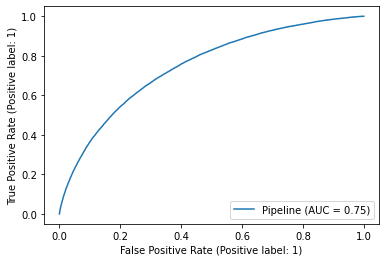

In [166]:
# prédiction sur l'ensemble des données

from sklearn.metrics import RocCurveDisplay, classification_report


# prédiction sur les données test
X,y=data.iloc[:,1:],data.iloc[:,0]
y_pred=loaded_model.predict(X)

# rapports de classification
print(classification_report(y,y_pred))


# courbe ROC
logreg_roc=RocCurveDisplay.from_estimator(loaded_model,X,y)

              precision    recall  f1-score   support

           0       0.67      0.68      0.68      3724
           1       0.68      0.67      0.67      3723

    accuracy                           0.68      7447
   macro avg       0.68      0.68      0.68      7447
weighted avg       0.68      0.68      0.68      7447



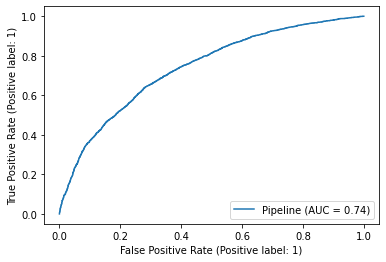

In [165]:
from sklearn.metrics import RocCurveDisplay, classification_report


# prédiction sur les données test
X_test,y_test=test.iloc[:,1:],test.iloc[:,0]
y_test_pred=loaded_model.predict(X_test)

# rapports de classification
print(classification_report(y_test,y_test_pred))


# courbe ROC
logreg_roc=RocCurveDisplay.from_estimator(loaded_model,X_test,y_test)

In [167]:
y_test_proba=loaded_model.predict_proba(X_test)

In [168]:
y_test_proba

array([[0.57654655, 0.42345345],
       [0.79519503, 0.20480497],
       [0.23337495, 0.76662505],
       ...,
       [0.56044423, 0.43955577],
       [0.84000667, 0.15999333],
       [0.7607635 , 0.2392365 ]])

In [169]:
proba_echecs=[p[1] for p in y_test_proba]
proba_echecs

[0.42345345412984176,
 0.2048049681657215,
 0.7666250477023889,
 0.17295423898399637,
 0.45632043403574196,
 0.44420580173849217,
 0.71650634427192,
 0.3835945939427155,
 0.7183604756398834,
 0.08791845035456335,
 0.513048424534531,
 0.6398389979896069,
 0.2123070584999486,
 0.5736664918687154,
 0.35850092614979134,
 0.09482385221055989,
 0.26656022194682166,
 0.4204340260879072,
 0.7361667800720539,
 0.4214377806749744,
 0.7844263099119034,
 0.8463016804947331,
 0.3625282992858018,
 0.6038845512167854,
 0.8711416820705654,
 0.11177337181556354,
 0.18309160573693095,
 0.56971469012181,
 0.45964491372113997,
 0.10939277190509583,
 0.8016616033740125,
 0.47335516680859163,
 0.8644523193499308,
 0.37941909099520005,
 0.8000789913990264,
 0.17194928873404786,
 0.6120142741684529,
 0.12223983350042489,
 0.7267995336008882,
 0.46786648164763106,
 0.44566700371132306,
 0.32511924960800037,
 0.17751151870495885,
 0.46169849290025555,
 0.878367514326586,
 0.17653677184106983,
 0.246623522976741

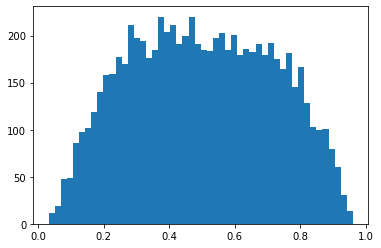

In [172]:
plt.hist(proba_echecs,bins=50)
plt.show()

In [355]:
def conf_mat_transform(conf_mat) :
    '''function to re-assign clusters by maximizing the diagonal of the confusion matrix'''

    # Inverse the number of items per categories (in order to use following function)
    conf_mat_temp = 1 /(conf_mat + 0.001)
    
    # apply function to get the combination of columns to minimize the diagonal 
    from scipy.optimize import linear_sum_assignment
    row_ind, col_ind = linear_sum_assignment(conf_mat_temp)

    # transform matrix according to new columns combination
    conf_mat_transform = conf_mat[:, col_ind]
    
    # reverse liste of column index
    corresp = col_ind.tolist()
    
    return corresp, conf_mat_transform

## Score «métier»

<i>Michaël vous fait part de sa vigilance dans l’élaboration du modèle, concernant deux points spécifiques au contexte métier : 

<i>Le déséquilibre entre le nombre de bons et de moins bons clients doit être pris en compte pour élaborer un modèle pertinent, à l’aide d’au moins une méthode au choix
Le déséquilibre du coût métier entre un faux négatif (FN - mauvais client prédit bon client : donc crédit accordé et perte en capital) et un faux positif (FP - bon client prédit mauvais : donc refus crédit et manque à gagner en marge)
Vous pourrez supposer, par exemple, que le coût d’un FN est dix fois supérieur au coût d’un FP
Vous créerez un score “métier” (minimisation du coût d’erreur de prédiction des FN et FP) pour comparer les modèles, afin de choisir le meilleur modèle et ses meilleurs hyperparamètres. Attention cette minimisation du coût métier doit passer par l’optimisation du seuil qui détermine, à partir d’une probabilité, la classe 0 ou 1 (un “predict” suppose un seuil à 0.5 qui n’est pas forcément l’optimum)
En parallèle, maintenez pour comparaison et contrôle des mesures plus techniques, telles que l’AUC et l’accuracy </i>

En admettant qu'un client considéré à tort comme pouvant rembourser le prêt (Faux Négatif) coute 10 fois plus cher qu'un client considéré à tort comme ne pouvant pas rembourser le prêt (Faux positif), nous pouvons considéré la matrice de gain suivante :

                  -   |    +
       F        -10   |  -1    
       V         1    |  10

Ainsi, si nous avons N_vn, N_vp, N_fn, N_fp l'effectif du nombre de vrai négatif, de vrai positif, de faux négatif et de faux négatif, le score métier que nous pourrion utiliser en cherchant à le maximiser pourrait être celui-ci :  
(-10 N_fn-N_fp+N_vn+10N_vp)/(N_vn+N_vp+N_fn+N_fp)

In [363]:
from sklearn.metrics import confusion_matrix
# récupération du nombre de vrais négatifs, faux négatifs, faux négatifs, vrais positifs 
tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred).ravel()

In [368]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer

# Définition de la fonction qui calcule le score métier personnalisé
def custom_scorer(y_true, y_pred):
    
    # Calcul de la matrice de confusion
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    # Calcul du score métier personnalisé
    score = (-10 * fn - fp + tn + 10 * tp) / (tn + tp + fn + fp)

    # Retourne le score métier personnalisé
    return score

# Création de l'objet scorer à partir de la fonction custom_scorer
custom_score = make_scorer(custom_scorer, greater_is_better=True)


In [370]:
custom_score

make_scorer(custom_scorer)

In [ ]:
# exemple d'utilisation de l'objet custom_score

from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier

# Création d'un objet de classification
clf = DecisionTreeClassifier()

# Calcul du score en utilisant cross_val_score avec notre mesure personnalisée
scores = cross_val_score(clf, X, y, cv=5, scoring=custom_score)

# Affichage du score moyen
print("Score moyen :", scores.mean())

## A ajouter

In [361]:
# implémenter fonction de coût

In [ ]:




# ####S'agissant du random_search, essayer d'implémenter ça avec les fonctions

# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import FunctionTransformer
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import GridSearchCV

# # Créer une instance de ColumnTransformer avec une fonction transformateur
# ct = ColumnTransformer(
#     transformers=[
#         ('transform', FunctionTransformer(), ['col1', 'col2'])
#     ],
#     # Ajouter les hyperparamètres de la fonction transformateur pour chaque colonne traitée
#     transformer_params={
#         'transform__func': [{
#             'param1': value1,
#             'param2': value2,
#         }, {
#             'param1': value3,
#             'param2': value4,
#         }]
#     }
# )

# # Créer un pipeline avec le ColumnTransformer et l'estimateur final
# pipe = Pipeline([
#     ('preprocess', ct),
#     ('model', estimator)
# ])

# # Définir la grille de recherche pour chaque hyperparamètre de la fonction transformateur
# param_grid = {
#     'preprocess__transform__func__param1': [value1, value2],
#     'preprocess__transform__func__param2': [value3, value4]
# }

# # Créer une instance de GridSearchCV
# grid_search = GridSearchCV(pipe, param_grid, cv=5)

# # Exécuter la recherche de grille
# grid_search.fit(X, y)

# # Obtenir les meilleurs hyperparamètres trouvés
# best_params = grid_search.best_params_


## Visualisation du modèle

In [68]:
application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
3,100006,0,Cash loans,F,N,Y,0,135000.00,312682.50,29686.50,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.00,513000.00,21865.50,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.00,254700.00,27558.00,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.00,269550.00,12001.50,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.00,677664.00,29979.00,...,0,0,0,0,1.00,0.00,0.00,1.00,0.00,1.00
307509,456254,1,Cash loans,F,N,Y,0,171000.00,370107.00,20205.00,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00


### Réseau de neurones MLP

In [11]:
from keras.models import Sequential
from keras.layers import Dense

# Définition du modèle
model = Sequential()

# Ajout des couches
model.add(Dense(units=64, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(units=1, activation='sigmoid'))

# Compilation du modèle
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Entraînement du modèle
model.fit(X_train_transformed, y_train, epochs=10, batch_size=32)

# Évaluation du modèle
loss_and_metrics = model.evaluate(X_test_transformed, y_test, batch_size=128)


Epoch 1/10
1397/1397 [==============================] - 3s 2ms/step - loss: 0.6237 - accuracy: 0.6553
Epoch 2/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.6065 - accuracy: 0.6726
Epoch 3/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.6018 - accuracy: 0.6747
Epoch 4/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.5989 - accuracy: 0.6773
Epoch 5/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.5972 - accuracy: 0.6794
Epoch 6/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.5943 - accuracy: 0.6817
Epoch 7/10
1397/1397 [==============================] - 3s 2ms/step - loss: 0.5920 - accuracy: 0.6817
Epoch 8/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.5899 - accuracy: 0.6856
Epoch 9/10
1397/1397 [==============================] - 2s 2ms/step - loss: 0.5881 - accuracy: 0.6861
Epoch 10/10
39/39 [==============================] - 0s 2ms/step - loss: 0.6016 - 

In [12]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from keras import regularizers





# Define MLP model
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])

# Train model
history = model.fit(X_train_transformed, y_train, validation_split=0.2, epochs=100, batch_size=128)

# Evaluate model on test set
score = model.evaluate(X_test_transformed, y_test, batch_size=128)
print("Test loss:", score[0])
print("Test accuracy:", score[1])


Epoch 1/100


C:\Users\hugo\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


280/280 [==============================] - 3s 8ms/step - loss: 0.7101 - accuracy: 0.5243 - val_loss: 0.6744 - val_accuracy: 0.6451
Epoch 2/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6615 - accuracy: 0.6373 - val_loss: 0.6371 - val_accuracy: 0.6623
Epoch 3/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6486 - accuracy: 0.6538 - val_loss: 0.6303 - val_accuracy: 0.6623
Epoch 4/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6423 - accuracy: 0.6580 - val_loss: 0.6272 - val_accuracy: 0.6669
Epoch 5/100
280/280 [==============================] - 1s 5ms/step - loss: 0.6369 - accuracy: 0.6620 - val_loss: 0.6235 - val_accuracy: 0.6671
Epoch 6/100
280/280 [==============================] - 2s 5ms/step - loss: 0.6359 - accuracy: 0.6626 - val_loss: 0.6226 - val_accuracy: 0.6680
Epoch 7/100
280/280 [==============================] - 1s 5ms/step - loss: 0.6338 - accuracy: 0.6621 - val_loss: 0.6215 - val_accuracy: 0.6649
Epoch 8/100

280/280 [==============================] - 2s 6ms/step - loss: 0.6046 - accuracy: 0.6920 - val_loss: 0.6162 - val_accuracy: 0.6725
Epoch 59/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6047 - accuracy: 0.6903 - val_loss: 0.6143 - val_accuracy: 0.6727
Epoch 60/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6034 - accuracy: 0.6893 - val_loss: 0.6149 - val_accuracy: 0.6711
Epoch 61/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6065 - accuracy: 0.6923 - val_loss: 0.6166 - val_accuracy: 0.6670
Epoch 62/100
280/280 [==============================] - 2s 8ms/step - loss: 0.6023 - accuracy: 0.6934 - val_loss: 0.6165 - val_accuracy: 0.6718
Epoch 63/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6042 - accuracy: 0.6934 - val_loss: 0.6157 - val_accuracy: 0.6664
Epoch 64/100
280/280 [==============================] - 2s 6ms/step - loss: 0.6038 - accuracy: 0.6917 - val_loss: 0.6154 - val_accuracy: 0.6689
Epoch

In [13]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score

# Utiliser le meilleur modèle pour prédire les résultats sur l'ensemble de test
y_pred_prob = model.predict(X_test_transformed)
y_pred = (y_pred_prob > 0.5).astype(int)

# Convertir les vraies étiquettes à des valeurs binaires
y_test_bin = (y_test > 0.5).astype(int)

# Afficher la matrice de confusion
conf_mat = confusion_matrix(y_test_bin, y_pred)
print("Matrice de confusion:\n", conf_mat)

156/156 [==============================] - 0s 2ms/step
Matrice de confusion:
 [[1868  584]
 [1122 1391]]


In [14]:
# Calculer et afficher les mesures de rappel et de précision
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
print("Précision par classe:", precision)
print("Rappel par classe:", recall)

Précision par classe: 0.6650151848682277
Rappel par classe: 0.6563947633434039


In [19]:
tmp=tmp.drop("TARGET",axis=1)

In [185]:
# pour l'ensemble du dataset
from sklearn.metrics import confusion_matrix, precision_score, recall_score

X_transformed=preprocessor.transform(tmp)

# Utiliser le meilleur modèle pour prédire les résultats sur l'ensemble de test
y_pred_prob = model.predict(X_transformed)
y_pred = (y_pred_prob > 0.5).astype(int)

# Convertir les vraies étiquettes à des valeurs binaires
y_bin = (target > 0.5).astype(int)

# Afficher la matrice de confusion
conf_mat = confusion_matrix(y_bin, y_pred)
print("Matrice de confusion:\n", conf_mat)

9610/9610 [==============================] - 13s 1ms/step
Matrice de confusion:
 [[216405  66281]
 [  9784  15041]]


In [190]:
y_pred_prob

array([[0.7543547 ],
       [0.34928125],
       [0.1791558 ],
       ...,
       [0.16382985],
       [0.38599452],
       [0.20659056]], dtype=float32)

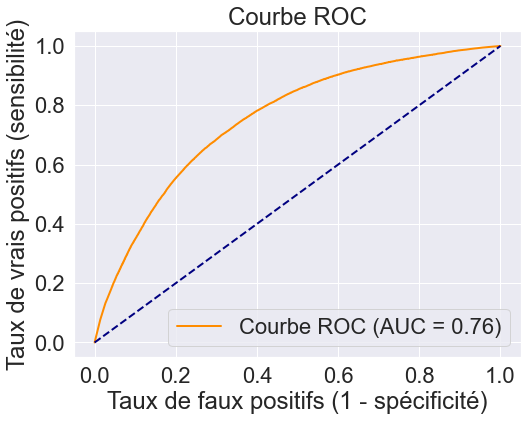

In [191]:
from sklearn.metrics import roc_curve, auc


# Calculer la courbe ROC et l'aire sous la courbe (AUC)
fpr, tpr, _ = roc_curve(y_bin, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Tracer la courbe ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taux de faux positifs (1 - spécificité)')
plt.ylabel('Taux de vrais positifs (sensibilité)')
plt.title('Courbe ROC')
plt.legend(loc="lower right")
plt.show()

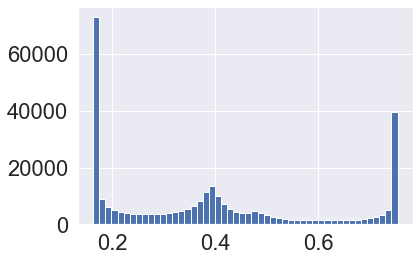

In [103]:
plt.hist(y_pred_prob,bins=50)
plt.show()

In [28]:
# Calculer et afficher les mesures de rappel et de précision
precision = precision_score(y_bin, y_pred)
recall = recall_score(y_bin, y_pred)
print("Précision par classe:", precision)
print("Rappel par classe:", recall)

Précision par classe: 0.18495610044022529
Rappel par classe: 0.6058811681772407


In [109]:
import os
path=os.getcwd()

In [120]:
model.save("model_MLP.h5")

In [134]:
mdl=keras.models.load_model("model_MLP.h5")


In [139]:
feature_names = [layer.name for layer in mdl.input_layers]
print("Feature Names:", feature_names)

AttributeError: 'Sequential' object has no attribute 'input_layers'

In [12]:
# exportation du modèle entrainté de régression logistique
import joblib


#joblib.dump(logistic_regression, 'modele_logistic_regression.pkl')
logistic_regression = joblib.load('modele_logistic_regression.pkl')



## Régression logistique 

In [ ]:
# un des meilleurs modèles selon LazyPredcit. A l'avantage de renvoyer des coefficients en plus
# d'une probabilité

In [14]:
X_train_transformed

array([[-0.59349059, -0.30909344, -0.85738412, ...,  0.45691246,
         0.53546129,  0.45912932],
       [ 0.76310704, -1.00869414, -1.12483798, ...,  0.53660288,
         0.53546129,  0.53875522],
       [ 3.47630231,  0.15730702,  0.83664783, ...,  0.45691246,
         0.47682266,  0.45912932],
       ...,
       [ 2.11970467, -0.07589321, -0.15756227, ...,  0.53660288,
         0.53546129,  0.53875522],
       [ 0.76310704, -0.49565363, -0.76767367, ...,  0.45691246,
         0.47682266,  0.45912932],
       [-0.59349059, -1.00869414, -0.99441878, ...,  0.53660288,
         0.53546129,  0.53875522]])

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split



# Définir le modèle de régression logistique
logistic_regression = LogisticRegression(max_iter=10000)

# Définir les hyperparamètres à optimiser avec GridSearchCV
parameters = {'C': [0.1, 1, 10], 'penalty': ['l1', 'l2']}

# Définir l'objet GridSearchCV
grid_search = GridSearchCV(estimator=logistic_regression, param_grid=parameters, cv=5)

# Exécuter la recherche sur grille avec l'ensemble d'entraînement
grid_search.fit(X_train_transformed, y_train)

# Afficher les meilleurs hyperparamètres trouvés
print("Meilleurs hyperparamètres : ", grid_search.best_params_)

# Évaluer les performances du modèle avec l'ensemble de test
accuracy = grid_search.score(X_test_transformed, y_test)
print("Précision : ", accuracy)


C:\Users\hugo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\hugo\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\hugo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\hugo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueErr

Meilleurs hyperparamètres :  {'C': 10, 'penalty': 'l2'}
Précision :  0.6801611278952668


In [21]:
logistic_regression=LogisticRegression(max_iter=10000,penalty="l2",C=10)

logistic_regression.fit(X_train_transformed,y_train)

# Obtenir les coefficients de pente
coef = logistic_regression.coef_

# Obtenir l'ordonnée à l'origine
intercept = logistic_regression.intercept_

# Afficher les coefficients et l'ordonnée à l'origine
print("Coefficients: ", coef)
print("Intercept: ", intercept)

Coefficients:  [[ 7.06226907e-02 -1.16828353e-02  9.02553942e-01  1.18460803e-01
  -9.76407350e-01  3.25539758e-02 -2.67463462e-02  5.02731281e+00
   4.19116461e-02  6.42353074e-02  0.00000000e+00  4.93510623e+00
   6.34065679e-02 -1.67457113e-02 -1.74621370e-02 -2.46050934e-02
  -6.88005346e-02 -6.28596760e-02  1.51133494e-01 -1.40046824e-02
  -2.90628257e-02 -3.64032377e-03 -1.09226356e-02  7.72852554e-02
  -5.03083438e-02  4.55781755e-02 -1.94938115e-01 -4.10666247e-01
  -5.12835577e-01  1.14779231e-01 -5.23824815e-01  9.68261775e-02
   3.28403570e-02  1.09432447e-01 -7.45814548e-03  8.68990343e-03
   3.21847581e-02  3.49626592e-02 -1.12768229e-01  1.05410676e-01
  -1.80873278e-02  8.08844522e-02 -3.65573793e-02 -1.68433123e-01
   2.21291513e-02  4.64964889e-02 -6.75863779e-02  3.43757431e-02
   4.26900947e-01 -8.96685764e-02 -1.15904453e-01 -1.15966025e-01
   1.35042312e-01 -2.40970678e-02 -9.60225679e-02  3.30760505e-02
   8.24091017e-03  8.51525887e-02  6.26601335e-02 -7.90354878

In [36]:
prob=logistic_regression.predict_proba(X_test_transformed)

In [38]:
prob[:,1]

array([0.72529058, 0.81632678, 0.28749092, ..., 0.67156945, 0.34994291,
       0.36225894])

In [23]:


# Obtenir les noms des variables d'entrée
input_variables = X_train.columns

# Obtenir les coefficients de pente
coef = logistic_regression.coef_[0]

# Créer une série à partir des variables et des coefficients
variable_coefficient = pd.Series(coef, index=input_variables)

# Trier la série par ordre décroissant des valeurs absolues
variable_coefficient = variable_coefficient.abs().sort_values(ascending=False)




FLAG_DOCUMENT_15                6.244581
AMT_ANNUITY                     5.027313
NAME_EDUCATION_TYPE             4.935106
AMT_REQ_CREDIT_BUREAU_DAY       3.298765
FLAG_DOCUMENT_14                3.240243
AMT_REQ_CREDIT_BUREAU_WEEK      2.373849
FLAG_DOCUMENT_19                2.029912
FLAG_DOCUMENT_20                1.742179
FLAG_DOCUMENT_13                1.470676
AMT_REQ_CREDIT_BUREAU_QRT       1.463271
CNT_CHILDREN                    0.976407
FLAG_OWN_CAR                    0.902554
FLAG_DOCUMENT_18                0.894089
AMT_REQ_CREDIT_BUREAU_HOUR      0.874898
AMT_REQ_CREDIT_BUREAU_YEAR      0.651440
FLAG_DOCUMENT_17                0.619895
HOUR_APPR_PROCESS_START         0.523825
REGION_RATING_CLIENT_W_CITY     0.512836
LIVINGAREA_AVG                  0.426901
REGION_RATING_CLIENT            0.410666
AMT_REQ_CREDIT_BUREAU_MON       0.241800
CNT_FAM_MEMBERS                 0.194938
YEARS_BEGINEXPLUATATION_AVG     0.168433
FLAG_DOCUMENT_16                0.161636
DAYS_ID_PUBLISH 

In [53]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score

# Utiliser le meilleur modèle pour prédire les résultats sur l'ensemble de test
y_pred_prob = logistic_regression.predict_proba(X_test_transformed)
y_pred_prob=y_pred_prob[:,1]
y_pred = (y_pred_prob > 0.5).astype(int)

# Convertir les vraies étiquettes à des valeurs binaires
y_test_bin = (y_test > 0.5).astype(int)

# Afficher la matrice de confusion
conf_mat = confusion_matrix(y_test_bin, y_pred)
print("Matrice de confusion:\n", conf_mat)

Matrice de confusion:
 [[1687  794]
 [ 794 1690]]


In [54]:
# Calculer et afficher les mesures de rappel et de précision
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
print("Précision par classe:", precision)
print("Rappel par classe:", recall)

Précision par classe: 0.6801611278952668
Rappel par classe: 0.6801611278952668


In [19]:
tmp=tmp.drop("TARGET",axis=1)

In [59]:
# pour l'ensemble du dataset
from sklearn.metrics import confusion_matrix, precision_score, recall_score

X_transformed=preprocessor.transform(tmp)

# Utiliser le meilleur modèle pour prédire les résultats sur l'ensemble de test
y_pred_prob = logistic_regression.predict_proba(X_transformed)
y_pred_prob=y_pred_prob[:,1]
y_pred = (y_pred_prob > 0.5).astype(int)

# Convertir les vraies étiquettes à des valeurs binaires
y_bin = (target > 0.5).astype(int)

# Afficher la matrice de confusion
conf_mat = confusion_matrix(y_bin, y_pred)
print("Matrice de confusion:\n", conf_mat)

Matrice de confusion:
 [[194142  88544]
 [  8005  16820]]


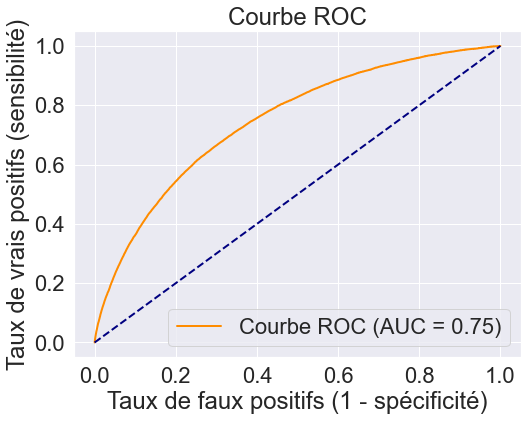

In [60]:
from sklearn.metrics import roc_curve, auc


# Calculer la courbe ROC et l'aire sous la courbe (AUC)
fpr, tpr, _ = roc_curve(y_bin, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Tracer la courbe ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taux de faux positifs (1 - spécificité)')
plt.ylabel('Taux de vrais positifs (sensibilité)')
plt.title('Courbe ROC')
plt.legend(loc="lower right")
plt.show()

In [61]:
# Calculer et afficher les mesures de rappel et de précision
precision = precision_score(y_bin, y_pred)
recall = recall_score(y_bin, y_pred)
print("Précision par classe:", precision)
print("Rappel par classe:", recall)

Précision par classe: 0.15963706768915378
Rappel par classe: 0.6775427995971802


### Dataframe à variable unique

In [ ]:
# Nous ferons varier l'age, le salaire, le prêt conttracté,  chacuns
# à la fois en fixant les autres variables. Seul la variable catégorielle "profession" variera

HOUSETYPE_MODE NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR CNT_CHILDREN
AMT_INCOME_TOTAL AMT_CREDIT NAME_INCOME_TYPE NAME_EDUCATION_TYPE NAME_FAMILY_STATUS NAME_HOUSING_TYPE DAYS_BIRTH OCCUPATION_TYPE

In [31]:
tmp

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
4,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
307507,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
307508,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
# fonction qui permet d'afficher un graphe 

import matplotlib.pyplot as plt
import seaborn as sns

def graph_fixed_df(dataf,variable,l=18000,model=logistic_regression):
    data_test=pd.DataFrame(index=range(l),columns=X.columns)
    m=application_train[variable].min()
    M=application_train[variable].max()
    d=M-m
    tmp_series=np.linspace(m-d/2,M+d/2,l)
    tmp_series=pd.Series(tmp_series)
    data_test[variable]=tmp_series
    
    float_cols = dataf.select_dtypes(include=['float']).columns.tolist()
    int_cols = dataf.select_dtypes(include=['int']).columns.tolist()
    num_cols=float_cols+int_cols
    object_cols = dataf.select_dtypes(include=['object']).columns.tolist()

    
    for col in X.columns:
        if col!=variable:
        
            if col in num_cols:
                data_test[col]=round(application_train[col].median(),2)

            if col in object_cols:
                data_test[col]=application_train[col].value_counts().index[0]
    
    
    occupation=[ 'Managers', 'Medicine staff', 'Private service staff','Low-skill Laborers' ,'IT staff']
    occupation=occupation*3600
    data_test.OCCUPATION_TYPE=occupation
    data_test_transformed=preprocessor.transform(data_test)
    
    #Nous pouvons enfin prédire la première variable et afficher le scatterplot
    y_pred=model.predict_proba(data_test_transformed)
    y_pred=y_pred[:,1]
    data_test["prob_failed"]=y_pred
    
    
    
    plt.close('all')
    # Clear the current figure
    plt.clf()
    palette=sns.color_palette(["#3498db","#e74c3c"])
    sns.set_palette(palette)
    sns.set_style("white")
    sns.set(font_scale = 2)
    plt.figure(figsize=[30,18])
    plt.subplot(111)
    #sns.stripplot(x='AMT_INCOME_TOTAL', data=data_test, y='prob_failed', hue='OCCUPATION_TYPE', orient='h', s=10, jitter=0.01, alpha=1)
    sns.scatterplot(data=data_test,x=variable,y="prob_failed",hue="OCCUPATION_TYPE",s=10)
    plt.legend(loc="upper left")


    # ajouter deux axesveritcales
    plt.axvline(x=m, color='red', linestyle='--',label="min")
    plt.axvline(x=M,color="green",linestyle="--",label="max")
    plt.legend(fontsize=14)
    plt.show()




    
    
    

In [55]:
tmp.columns[:50]

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

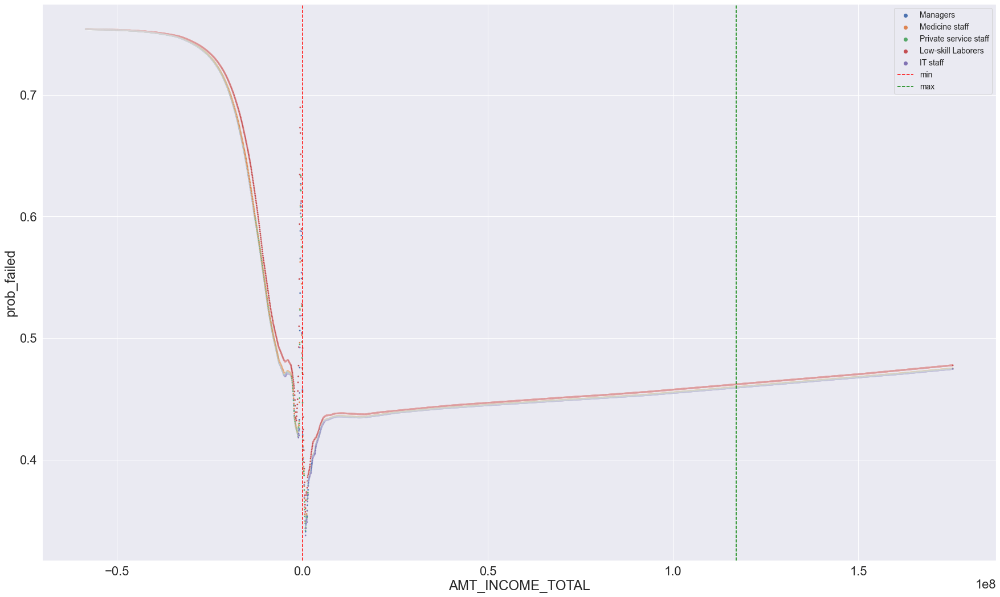

In [43]:
# réseau de neurones
graph_fixed_df(tmp,"AMT_INCOME_TOTAL")

<Figure size 432x288 with 0 Axes>

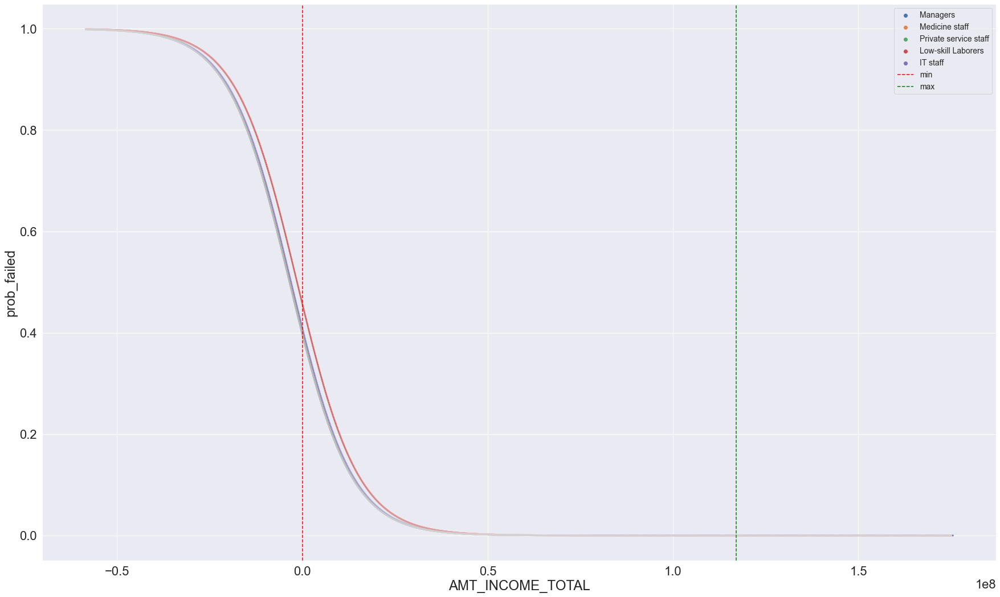

In [40]:
# régression logistique
graph_fixed_df(tmp,"AMT_INCOME_TOTAL")

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

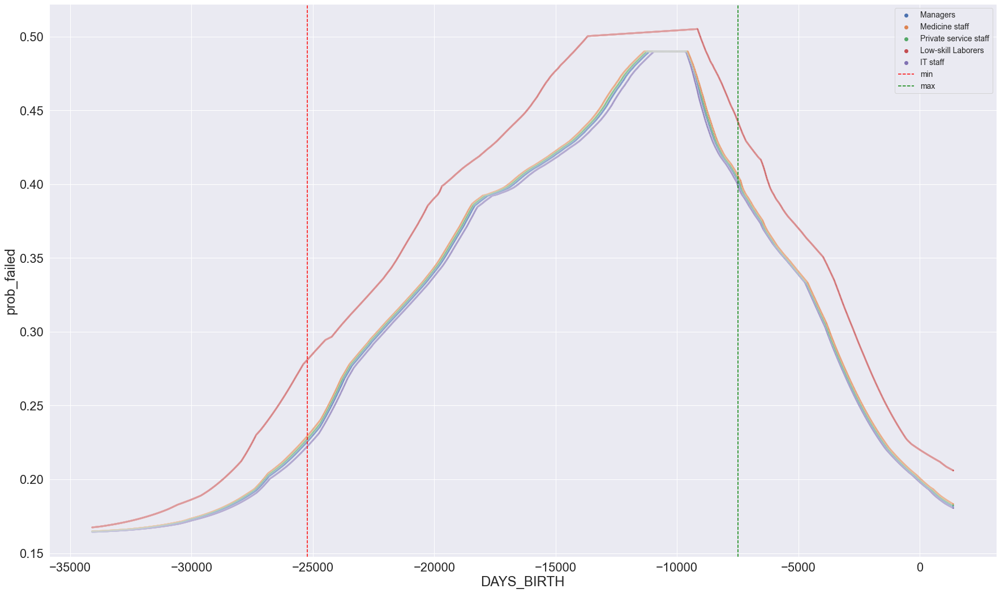

In [45]:
# réseau de neurones
graph_fixed_df(tmp,"DAYS_BIRTH")

<Figure size 432x288 with 0 Axes>

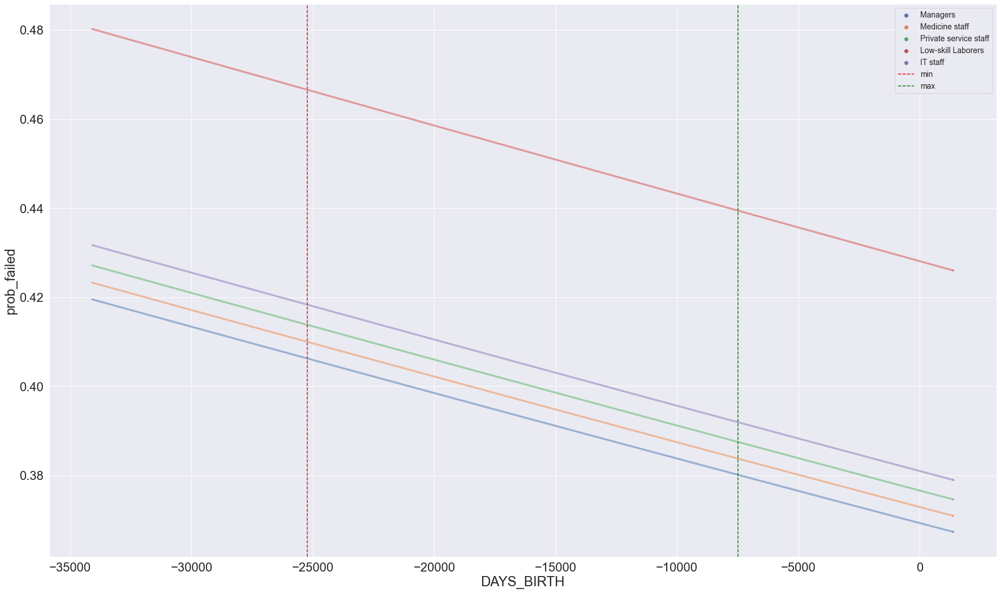

In [41]:
# régression logistique
graph_fixed_df(tmp,"DAYS_BIRTH")

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

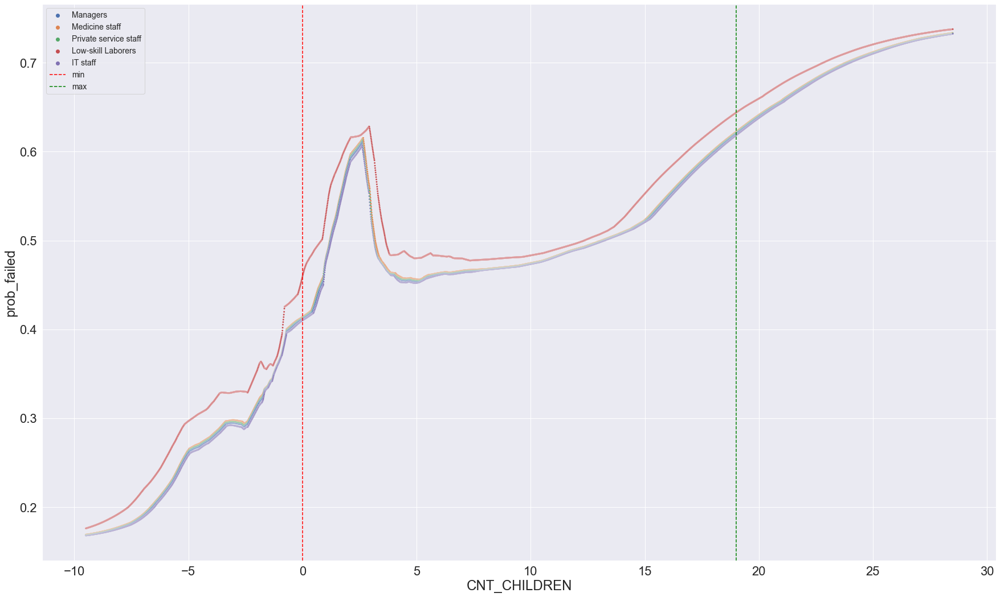

In [47]:
# réseau de neurones
graph_fixed_df(tmp,"CNT_CHILDREN")

<Figure size 432x288 with 0 Axes>

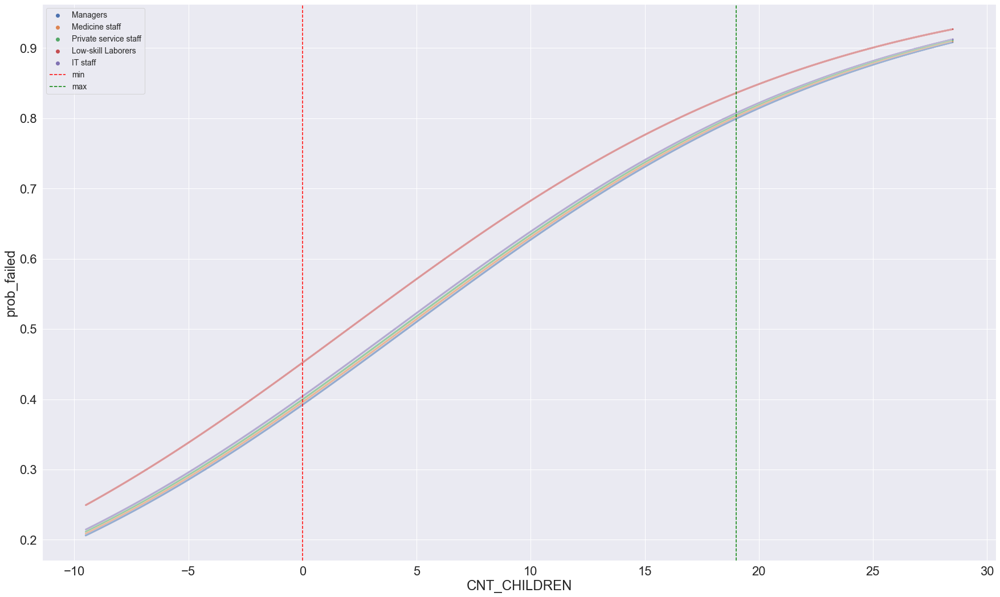

In [42]:
# régression logistique 
graph_fixed_df(tmp,"CNT_CHILDREN")

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

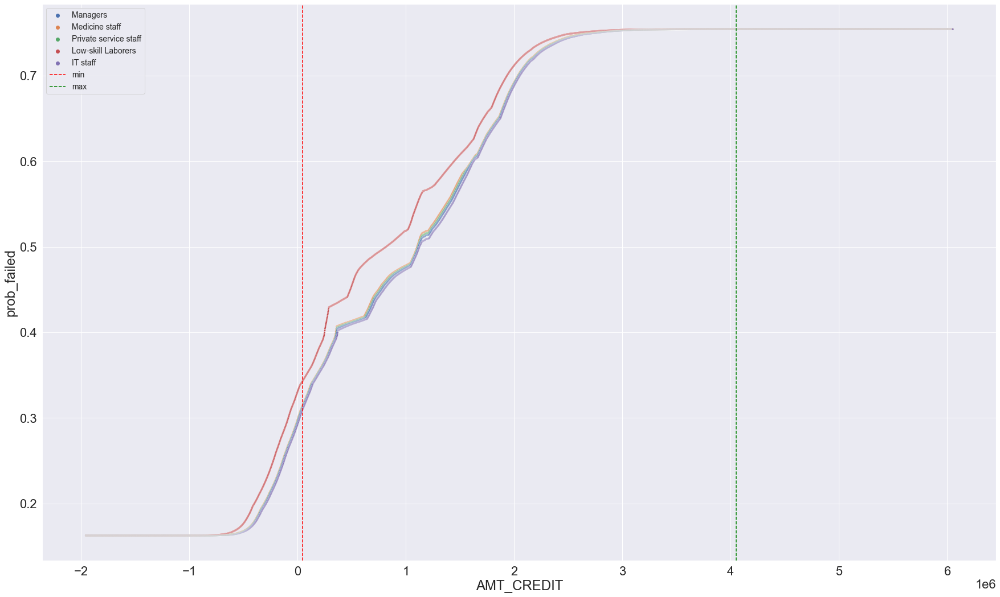

In [48]:
# réseau de neurones
graph_fixed_df(tmp,"AMT_CREDIT")

<Figure size 432x288 with 0 Axes>

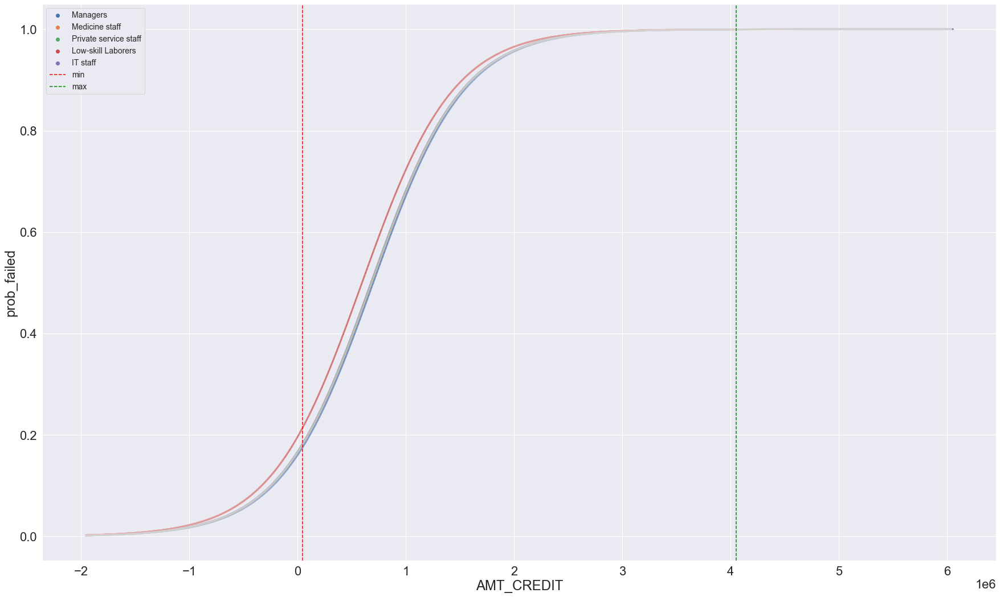

In [43]:
# régression logistique 
graph_fixed_df(tmp,"AMT_CREDIT")

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

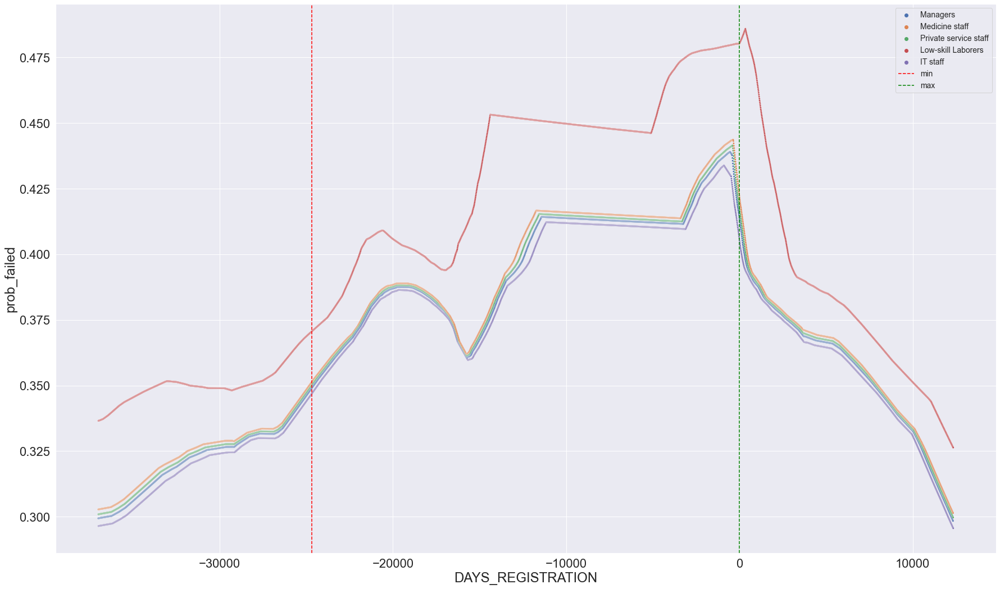

In [50]:
# réseau de neurones
graph_fixed_df(tmp,"DAYS_REGISTRATION")

<Figure size 432x288 with 0 Axes>

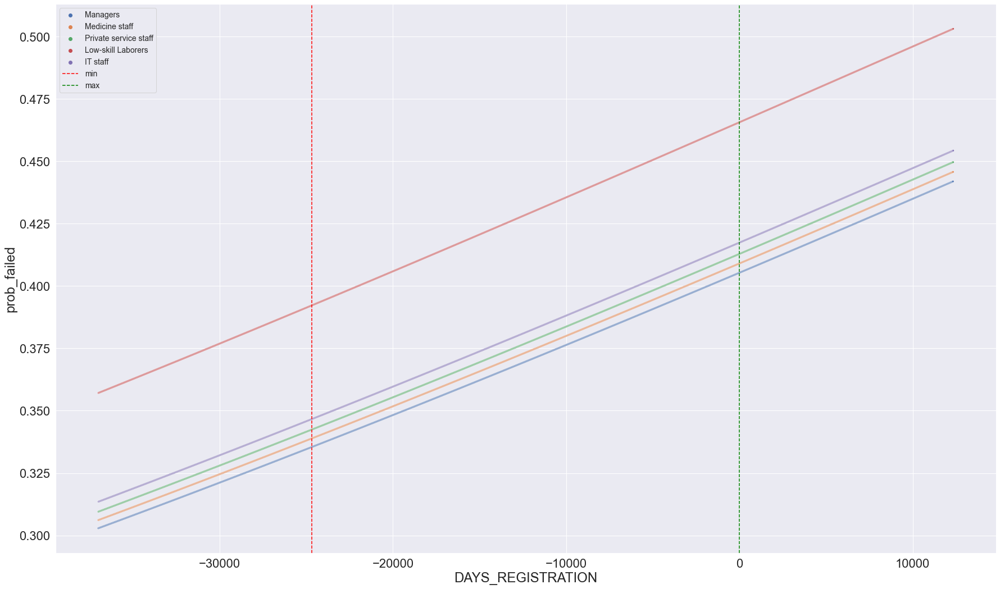

In [45]:
#régression logistique 
graph_fixed_df(tmp,"DAYS_REGISTRATION")

<Figure size 432x288 with 0 Axes>

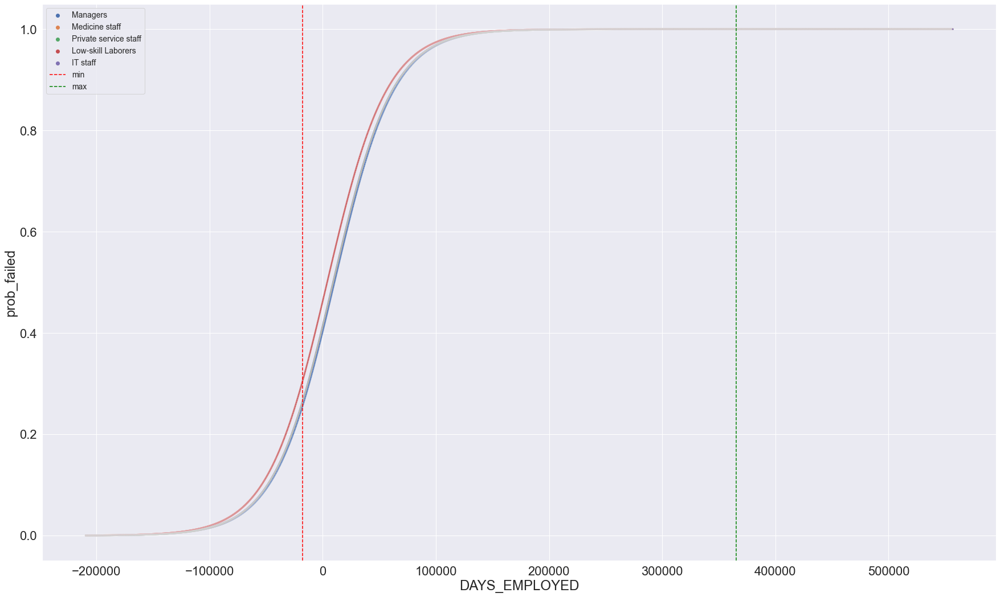

In [44]:
# régression logistique
graph_fixed_df(tmp,"DAYS_EMPLOYED")

563/563 [==============================] - 1s 2ms/step


<Figure size 432x288 with 0 Axes>

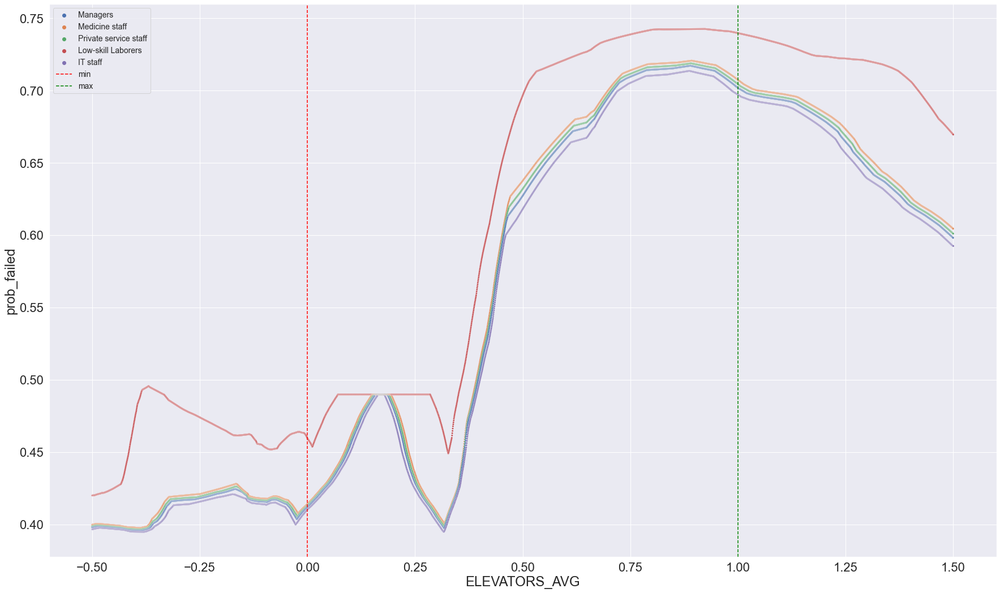

In [52]:
graph_fixed_df(tmp,"ELEVATORS_AVG")

<Figure size 432x288 with 0 Axes>

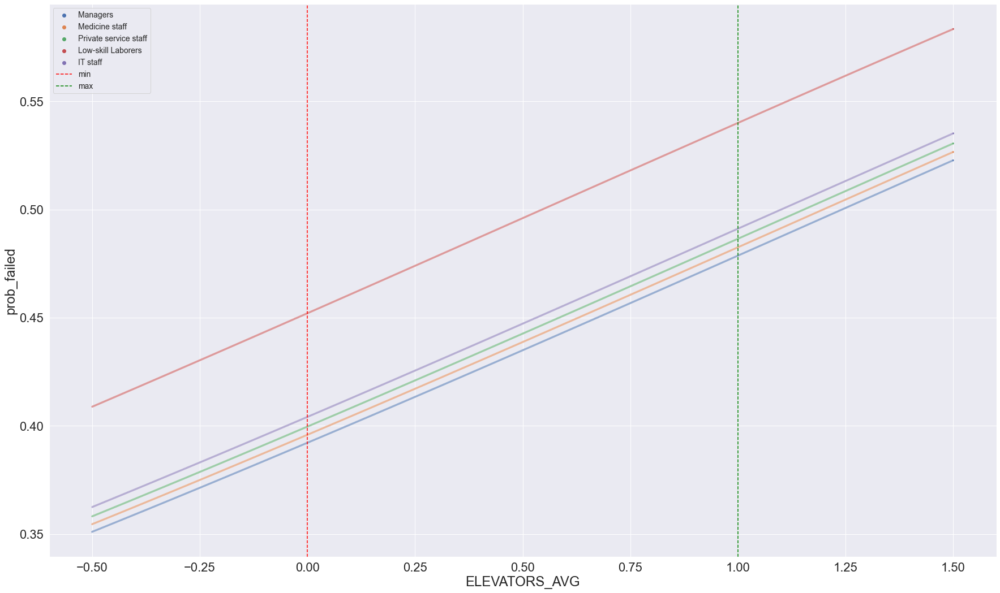

In [46]:
# régression logistique
graph_fixed_df(tmp,"ELEVATORS_AVG")

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

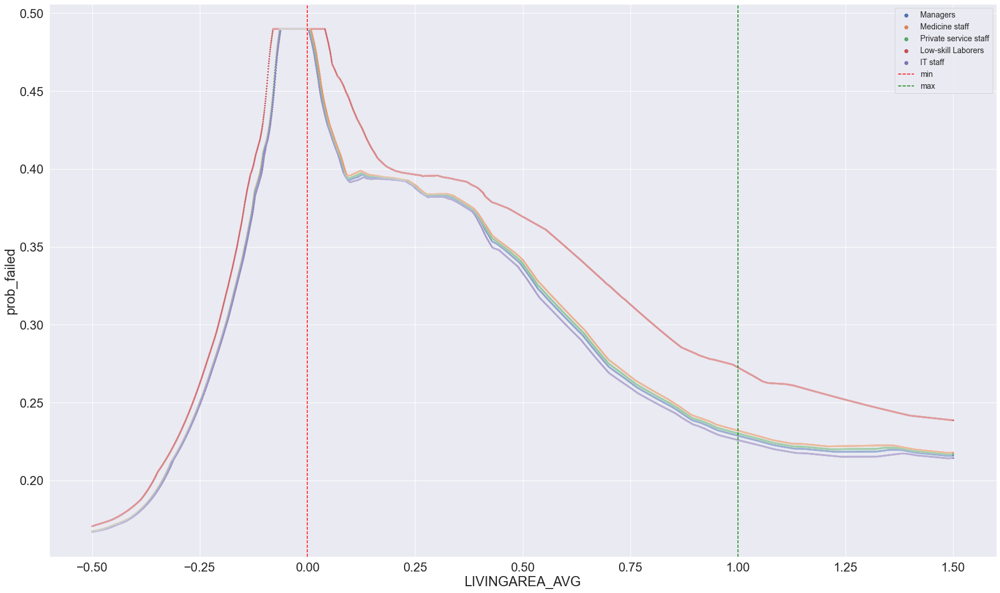

In [53]:
graph_fixed_df(tmp,"LIVINGAREA_AVG")

<Figure size 432x288 with 0 Axes>

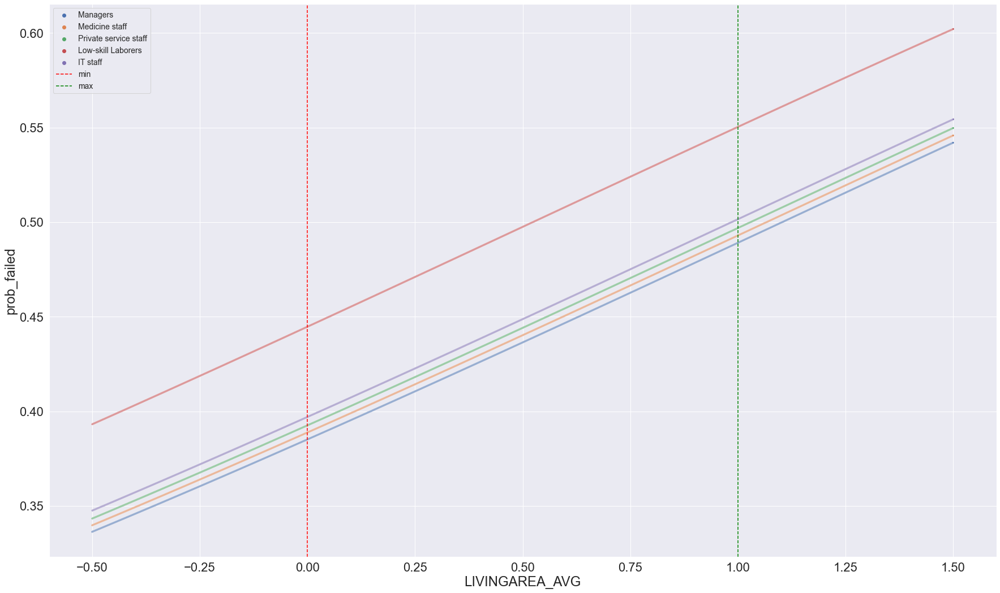

In [47]:
# régression logistique
graph_fixed_df(tmp,"LIVINGAREA_AVG")

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

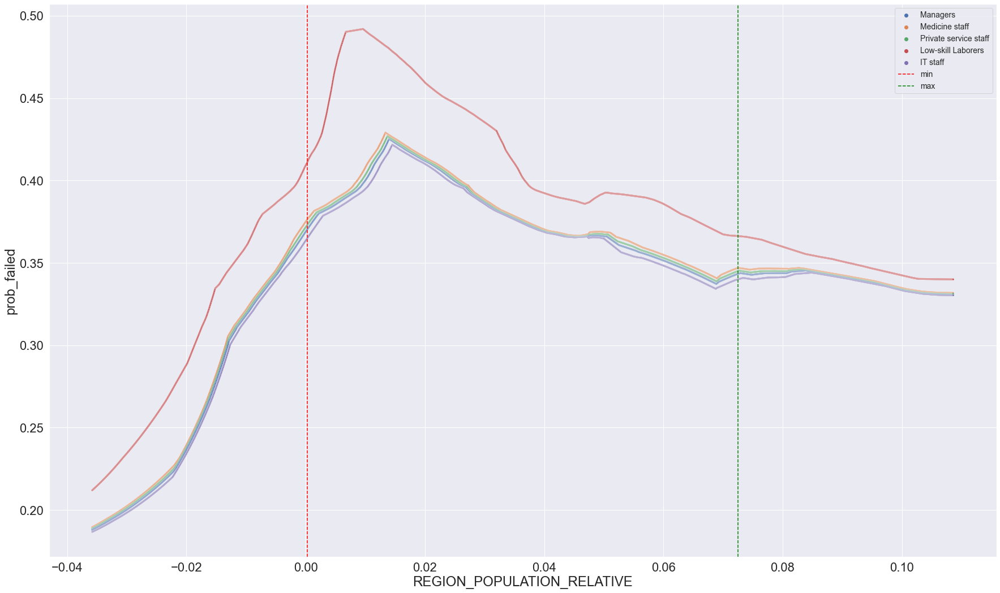

In [68]:
graph_fixed_df(tmp,'REGION_POPULATION_RELATIVE')

<Figure size 432x288 with 0 Axes>

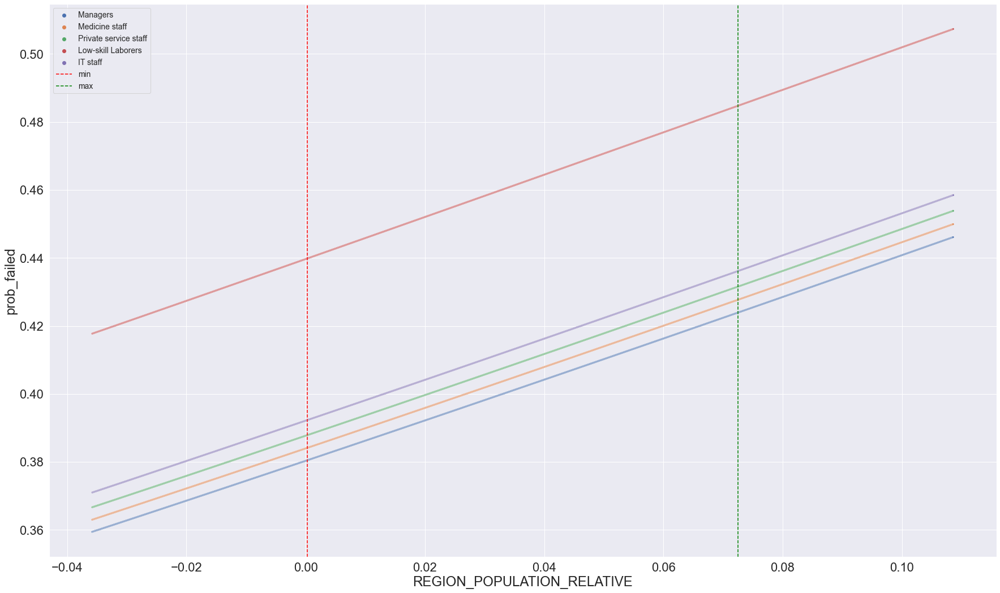

In [48]:
# régression logistique
graph_fixed_df(tmp,'REGION_POPULATION_RELATIVE')

563/563 [==============================] - 1s 1ms/step


<Figure size 432x288 with 0 Axes>

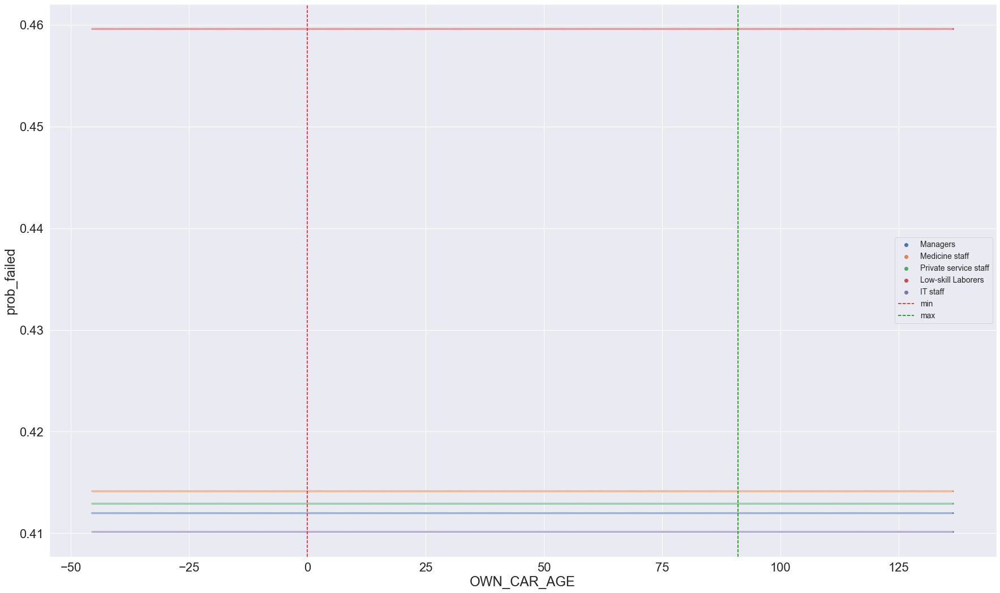

In [69]:
graph_fixed_df(tmp,'OWN_CAR_AGE')

<Figure size 432x288 with 0 Axes>

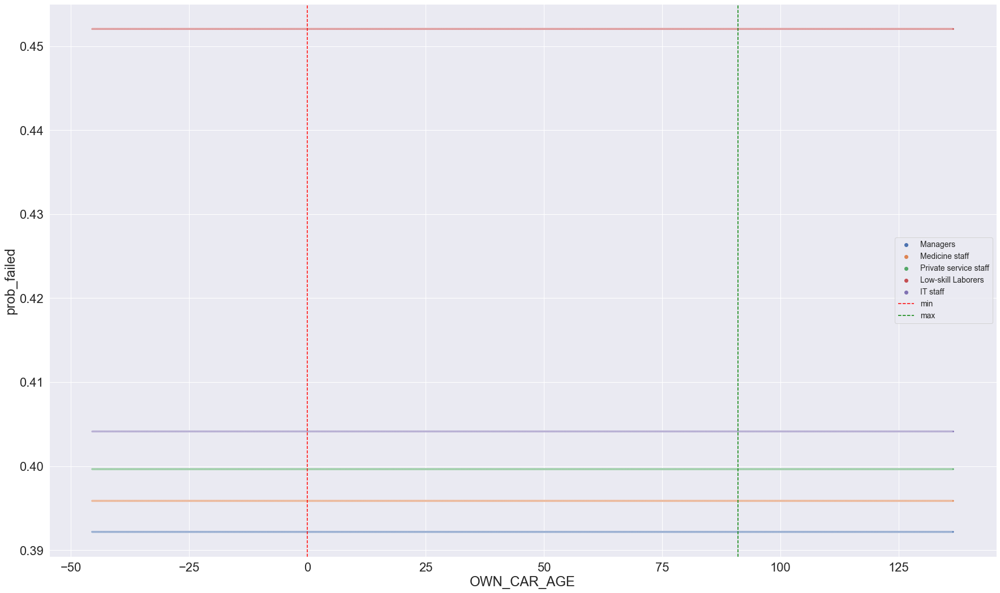

In [49]:
# régression logistique 
graph_fixed_df(tmp,'OWN_CAR_AGE')

## Explication du modèle avec SHAP

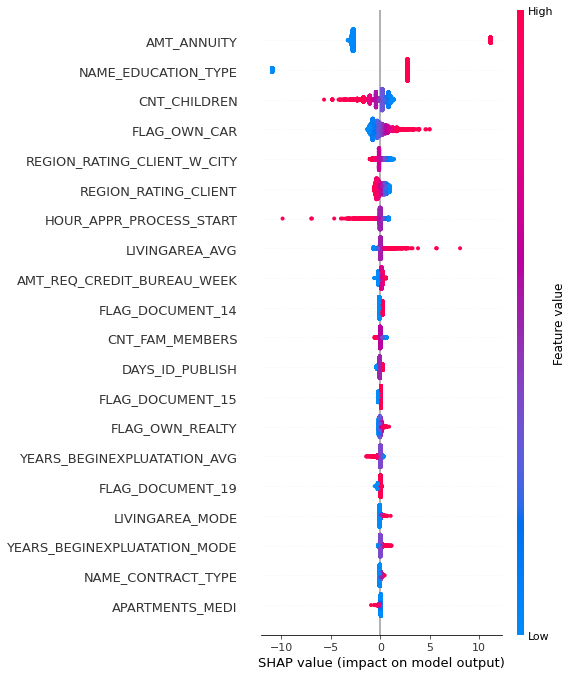

In [18]:
import shap

# summarize the background data to reduce memory usage
#background_summary = shap.sample(X_train_transformed, 500)

# create the explainer object using the summarized background data
explainer = shap.LinearExplainer(logistic_regression, X_train_transformed)
shap_values = explainer.shap_values(X_test_transformed)

# plot the first instance's explanation
shap.summary_plot(shap_values, X_test_transformed,feature_names=X_train.columns)


Le graphique `summary_plot` de SHAP est un outil utile pour interpréter les prédictions d'un modèle de régression. Il permet de visualiser l'importance des variables explicatives pour chaque instance de l'ensemble de données de test.

Chaque point sur le graphique représente une instance de l'ensemble de données de test. La position horizontale du point indique l'impact de la variable explicative sur la prédiction, tandis que la couleur du point indique la valeur de la variable explicative pour cette instance. Les variables sont triées par ordre d'importance moyenne sur toutes les instances de l'ensemble de données de test.

Les points sont alignés verticalement pour faciliter la comparaison entre les différentes instances de l'ensemble de données de test. Les points situés à droite sont associés à des prédictions plus élevées, tandis que les points situés à gauche sont associés à des prédictions plus faibles.

Le graphique `summary_plot` est particulièrement utile pour identifier les variables qui ont le plus d'impact sur les prédictions du modèle. Les variables situées en haut du graphique sont les plus importantes, tandis que les variables situées en bas ont un impact moins important. Les variables qui ont une influence positive sur les prédictions sont affichées en rouge, tandis que les variables qui ont une influence négative sont affichées en bleu.

Il est important de noter que le graphique `summary_plot` ne permet pas de déterminer la causalité des relations entre les variables explicatives et les prédictions du modèle. Il fournit simplement des informations sur l'importance relative des variables pour les prédictions du modèle.

Il est tout à fait possible d'avoir des points rouges et bleus pour une même variable dans le graphique summary_plot de SHAP. Cela indique que la variable explicative a un impact à la fois positif et négatif sur la prédiction du modèle en fonction de sa valeur.

Par exemple, supposons que la variable explicative "Âge" ait des valeurs comprises entre 20 et 60 ans dans l'ensemble de données de test. Si le modèle de régression prédit une probabilité plus élevée pour les clients de moins de 30 ans et une probabilité plus faible pour les clients de plus de 40 ans, alors les instances de l'ensemble de données avec des valeurs d'âge inférieures à 30 ans peuvent être représentées en rouge et celles avec des valeurs d'âge supérieures à 40 ans peuvent être représentées en bleu.

Dans ce cas, la variable "Âge" aura un impact positif sur les prédictions pour les clients plus jeunes et un impact négatif sur les prédictions pour les clients plus âgés. Cela peut être interprété comme indiquant que les clients plus jeunes ont une probabilité plus élevée de souscrire à un produit ou un service que les clients plus âgés. Cependant, il est important de noter que le graphique summary_plot ne permet pas de déterminer la causalité de la relation entre l'âge et la probabilité de souscrire à un produit ou un service.

In [ ]:
##################

In [67]:
for d in description.values:
    print(d)

['SK_ID_CURR' 'ID of loan in our sample']
['TARGET'
 'Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)']
['NAME_CONTRACT_TYPE' 'Identification if loan is cash or revolving']
['CODE_GENDER' 'Gender of the client']
['FLAG_OWN_CAR' 'Flag if the client owns a car']
['FLAG_OWN_REALTY' 'Flag if client owns a house or flat']
['CNT_CHILDREN' 'Number of children the client has']
['AMT_INCOME_TOTAL' 'Income of the client']
['AMT_CREDIT' 'Credit amount of the loan']
['AMT_ANNUITY' 'Loan annuity']
['AMT_GOODS_PRICE'
 'For consumer loans it is the price of the goods for which the loan is given']
['NAME_TYPE_SUITE'
 'Who was accompanying client when he was applying for the loan']
['NAME_INCOME_TYPE'
 'Clients income type (businessman, working, maternity leave,\x85)']
['NAME_EDUCATION_TYPE' 'Level of highest education the client achieved']
['NAME_FAMILY_STATUS' 'F

In [ ]:
# bannir SVC ,RFR,LinearSVC et ETRet CAlibratedClassifier car trop couteux

In [ ]:
## avec des classes pour pipeline à voir

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer

class FillNaTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, strategy='mean'):
        self.strategy = strategy
        self.imputer = SimpleImputer(strategy=self.strategy)
        
    def fit(self, X, y=None):
        self.imputer.fit(X)
        return self
    
    def transform(self, X):
        return self.imputer.transform(X)

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pipeline = Pipeline([
    ('fill_na', FillNaTransformer(strategy='mean')),
    ('scaler', StandardScaler())
])

In [341]:


from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer

class FillNaTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, num_strategy='mean', cat_strategy='most_frequent', cat_fill_value='Unknown'):
        self.num_strategy = num_strategy
        self.cat_strategy = cat_strategy
        self.cat_fill_value = cat_fill_value

    def fit(self, X, y=None):
        self.imputer = SimpleImputer(strategy=self.num_strategy)
        self.cat_fill = dict()
        for col in X.select_dtypes(include=['object']):
            self.cat_fill[col] = X[col].value_counts().index[0] if self.cat_strategy == 'most_frequent' else self.cat_fill_value
        return self

    def transform(self, X, y=None):
        num_cols = X.select_dtypes(include=['int', 'float']).columns
        cat_cols = X.select_dtypes(include=['object']).columns

        X[num_cols] = self.imputer.transform(X[num_cols])
        for col in cat_cols:
            X[col] = X[col].fillna(self.cat_fill[col])

        return X


## Analyse

In [ ]:
#########

In [ ]:
#PAS FORCEMENT NECESSAIRE

In [ ]:
###########

## 2) bureau /bureau_test


<b>bureau.csv</b>  
All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

<b>bureau_balance.csv</b>  
Monthly balances of previous credits in Credit Bureau.
This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.


bureau.csv
Tous les crédits antérieurs du client fournis par d'autres institutions financières qui ont été signalés à Credit Bureau (pour les clients qui ont un prêt dans notre échantillon). Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans Credit Bureau avant la date de la demande.

bureau_balance.csv
Soldes mensuels des crédits précédents dans Credit Bureau. Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit antérieur déclaré au bureau de crédit - c'est-à-dire que le tableau comporte (# prêts dans l'échantillon * # crédits antérieurs relatifs * # mois où nous disposons d'un historique observable pour les crédits antérieurs) lignes.



In [21]:
bureau=pd.read_csv("bureau.csv")

In [57]:
bureau_balance=pd.read_csv("bureau_balance.csv")
bureau_balance[:50]

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
5,5715448,-5,C
6,5715448,-6,C
7,5715448,-7,C
8,5715448,-8,C
9,5715448,-9,0


['SK_ID_CURR', 'AMT_ANNUITY']

In [65]:
months_bal=bureau_balance.MONTHS_BALANCE.value_counts()
months_bal

-1     622601
-2     619243
-3     615080
 0     610965
-4     609138
        ...  
-92     57300
-93     53535
-94     49965
-95     46542
-96     43147
Name: MONTHS_BALANCE, Length: 97, dtype: int64

In [69]:
bureau_balance.loc[bureau_balance.MONTHS_BALANCE==0,"STATUS"].value_counts()

C    345675
X    130954
0    128078
1      4865
5       976
2       272
3        83
4        62
Name: STATUS, dtype: int64

plusieurs lignes par ID, un par crédit pour chaque prêt

In [55]:
col_description.loc[(col_description.Table=="bureau_balance.csv")&(col_description.Row=="STATUS"),"Description"].values[0]

'Status of Credit Bureau loan during the month (active, closed, DPD0-30,\x85 [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,\x85 5 means DPD 120+ or sold or written off ] )'

In [58]:
col_description.loc[(col_description.Table=="bureau_balance.csv")&(col_description.Row=="MONTHS_BALANCE"),"Description"].values[0]

'Month of balance relative to application date (-1 means the freshest balance date)'

Il s'agit d'une variable catégorielle qui indique le statut d'un prêt auprès d'un bureau de crédit pendant le mois. Les valeurs possibles sont :

"active" : le prêt est en cours et les paiements sont à jour.  
"closed" (C) : le prêt a été remboursé intégralement et est fermé.   
"DPD0-30" : le prêt est en cours, mais des paiements ont été manqués ou effectués en retard de 1 à 30 jours.  
"DPD31-60" : le prêt est en cours, mais des paiements ont été manqués ou effectués en retard de 31 à 60 jours.  
"DPD61-90" : le prêt est en cours, mais des paiements ont été manqués ou effectués en retard de 61 à 90 jours.  
"DPD91-120" : le prêt est en cours, mais des paiements ont été manqués ou effectués en retard de 91 à 120 jours.  
"DPD120+" : le prêt est en cours, mais des paiements ont été manqués ou effectués en retard de plus de 120 jours, ou le prêt a été vendu ou écrit hors bilan.  
La lettre "X" peut également être utilisée pour indiquer que le statut du prêt est inconnu. Cette variable peut être utilisée comme caractéristique dans des modèles de crédit pour prédire la probabilité de défaut de paiement d'un emprunteur.

In [53]:
#bureau.csv
bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [95]:
col_description.loc[(col_description.Table=="bureau.csv")& (col_description.Row=="CREDIT_DAY_OVERDUE"),"Description"].values[0]

'Number of days past due on CB credit at the time of application for related loan in our sample'

 ne pas prendre en compte le dataset bureau_balance (trop compliqué),
s'agissant de bureau.csv, il faudrait: 
 - ajouter le nombre de crédit précédent, le status pour chacun de ces crédits (closed,active,sold,bad debt)

- ne pas garder currency car ce n'est pas une variable claire et "currency 1" représente quasiment la totalité de l'échantillon

- remplacer DAYS CREDIT par fréquence et récence

In [96]:
bureau.CREDIT_DAY_OVERDUE.value_counts()

0       1712211
30          311
60          126
8           103
13          103
         ...   
1445          1
278           1
707           1
2193          1
1931          1
Name: CREDIT_DAY_OVERDUE, Length: 942, dtype: int64

plusieurs lignes par ID, un par prêt

In [44]:
bureau.SK_ID_CURR.nunique()

305811

In [76]:
bureau.loc[bureau.SK_ID_BUREAU==5715448,:]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
768,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0


In [75]:
bureau_balance.loc[bureau_balance.SK_ID_BUREAU==5715448,:]

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
5,5715448,-5,C
6,5715448,-6,C
7,5715448,-7,C
8,5715448,-8,C
9,5715448,-9,0


In [23]:
description_bureau=col_description.loc[col_description.Table=="bureau.csv","Description"]


In [24]:
description_bureau

122    ID of loan in our sample - one loan in our sam...
123    Recoded ID of previous Credit Bureau credit re...
124    Status of the Credit Bureau (CB) reported credits
125         Recoded currency of the Credit Bureau credit
126    How many days before current application did c...
127    Number of days past due on CB credit at the ti...
128    Remaining duration of CB credit (in days) at t...
129    Days since CB credit ended at the time of appl...
130    Maximal amount overdue on the Credit Bureau cr...
131    How many times was the Credit Bureau credit pr...
132    Current credit amount for the Credit Bureau cr...
133                 Current debt on Credit Bureau credit
134    Current credit limit of credit card reported i...
135       Current amount overdue on Credit Bureau credit
136         Type of Credit Bureau credit (Car, cash,...)
137    How many days before loan application did last...
138                  Annuity of the Credit Bureau credit
Name: Description, dtype: objec

## 3) Credit_card_balance

<b>credit_card_balance.csv</b>  
Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.


In [31]:
import gc
gc.collect()

4086

In [32]:
cc_balance=pd.read_csv("credit_card_balance.csv")
cc_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,...,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,...,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


['SK_ID_CURR']

In [98]:
cc_balance.loc[cc_balance.SK_ID_CURR==363914,:]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.0,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
32636,2582071,363914,-82,16809.210,67500,0.0,0.0,0.0,0.0,3375.0,...,16809.210,16809.210,0.0,0,0.0,0.0,18.0,Active,0,0
38922,2582071,363914,-84,27577.890,67500,0.0,0.0,0.0,0.0,3375.0,...,27577.890,27577.890,0.0,0,0.0,0.0,16.0,Active,0,0
104903,2582071,363914,-7,65159.235,45000,0.0,0.0,0.0,0.0,2250.0,...,65609.235,65609.235,0.0,0,0.0,0.0,63.0,Active,0,0
110618,2582071,363914,-59,70475.850,67500,24750.0,24750.0,0.0,0.0,3375.0,...,70475.850,70475.850,4.0,4,0.0,0.0,41.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3400275,2582071,363914,-64,43447.230,67500,0.0,0.0,0.0,0.0,3375.0,...,43447.230,43447.230,0.0,0,0.0,0.0,36.0,Active,0,0
3433927,2582071,363914,-85,30625.020,67500,0.0,0.0,0.0,0.0,3375.0,...,30625.020,30625.020,0.0,0,0.0,0.0,15.0,Active,0,0
3442371,2582071,363914,-60,43725.015,67500,0.0,0.0,0.0,0.0,3375.0,...,43725.015,43725.015,0.0,0,0.0,0.0,40.0,Active,0,0
3631371,2582071,363914,-6,62856.405,45000,0.0,0.0,0.0,0.0,2250.0,...,63081.405,63081.405,0.0,0,0.0,0.0,64.0,Active,0,0


In [45]:
cc_balance.SK_ID_CURR.nunique()

103558

plusieurs lignes par ID, captures mensuels des soldes des cartes de crédit

In [121]:
cc_balance.loc[cc_balance.SK_ID_CURR==378907].sort_values(by="MONTHS_BALANCE")

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
1811769,2562384,378907,-48,69186.690,270000,67500.0,67500.000,0.0,0.000,NaN,...,67841.190,67841.190,1.0,1,0.0,0.0,NaN,Active,0,0
2584127,2562384,378907,-47,62727.075,270000,0.0,0.000,0.0,0.000,3498.975,...,63246.825,63246.825,0.0,0,0.0,0.0,1.0,Active,0,0
3284876,2562384,378907,-46,62577.900,270000,0.0,0.000,0.0,0.000,3399.795,...,63082.080,63082.080,0.0,0,0.0,0.0,2.0,Active,0,0
2653597,2562384,378907,-45,61484.400,270000,0.0,0.000,0.0,0.000,3346.695,...,61980.255,61980.255,0.0,0,0.0,0.0,3.0,Active,0,0
1039133,2562384,378907,-44,60736.680,270000,0.0,0.000,0.0,0.000,3291.390,...,61224.345,61224.345,0.0,0,0.0,0.0,4.0,Active,0,0
2021610,2562384,378907,-43,59786.865,270000,0.0,0.000,0.0,0.000,3242.250,...,60267.735,60267.735,0.0,0,0.0,0.0,5.0,Active,0,0
1764744,2562384,378907,-42,58743.675,270000,0.0,0.000,0.0,0.000,3194.190,...,59216.985,59216.985,0.0,0,0.0,0.0,6.0,Active,0,0
2239489,2562384,378907,-41,57725.595,270000,0.0,0.000,0.0,0.000,3141.450,...,58191.525,58191.525,0.0,0,0.0,0.0,7.0,Active,0,0
2648695,2562384,378907,-40,51462.360,270000,0.0,0.000,0.0,0.000,3089.925,...,51920.145,51920.145,0.0,0,0.0,0.0,8.0,Active,0,0
561468,2562384,378907,-39,56570.940,270000,0.0,0.000,0.0,0.000,2761.740,...,56570.940,56570.940,0.0,0,0.0,0.0,9.0,Active,6,6


In [111]:
col_description.loc[(col_description.Table=="credit_card_balance.csv"),:]

,Unnamed: 0,Table,Row,Description,Special
150,153,credit_card_balance.csv,SK_ID_PREV,ID of previous credit in Home credit related t...,hashed
151,154,credit_card_balance.csv,SK_ID_CURR,ID of loan in our sample,hashed
152,155,credit_card_balance.csv,MONTHS_BALANCE,Month of balance relative to application date ...,time only relative to the application
153,156,credit_card_balance.csv,AMT_BALANCE,Balance during the month of previous credit,NaN
154,157,credit_card_balance.csv,AMT_CREDIT_LIMIT_ACTUAL,Credit card limit during the month of the prev...,NaN
155,158,credit_card_balance.csv,AMT_DRAWINGS_ATM_CURRENT,Amount drawing at ATM during the month of the ...,NaN
156,159,credit_card_balance.csv,AMT_DRAWINGS_CURRENT,Amount drawing during the month of the previou...,NaN
157,160,credit_card_balance.csv,AMT_DRAWINGS_OTHER_CURRENT,Amount of other drawings during the month of t...,NaN
158,161,credit_card_balance.csv,AMT_DRAWINGS_POS_CURRENT,Amount drawing or buying goods during the mont...,NaN
159,162,credit_card_balance.csv,AMT_INST_MIN_REGULARITY,Minimal installment for this month of the prev...,NaN


In [126]:
col_description.loc[(col_description.Table=="credit_card_balance.csv")&(col_description.Row=="AMT_DRAWINGS_CURRENT"),:].values[0]

array([159, 'credit_card_balance.csv', 'AMT_DRAWINGS_CURRENT',
       'Amount drawing during the month of the previous credit', nan],
      dtype=object)

In [118]:
col_description.loc[(col_description.Table=="credit_card_balance.csv"),"Row"].tolist()

['SK_ID_PREV ',
 'SK_ID_CURR',
 'MONTHS_BALANCE',
 'AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM',
 'NAME_CONTRACT_STATUS',
 'SK_DPD',
 'SK_DPD_DEF']

## 4) installments_payments.csv

<b>installments_payments.csv</b>  
Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
There is a) one row for every payment that was made plus b) one row each for missed payment.
One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

In [33]:
inst_payments=pd.read_csv("installments_payments.csv")

In [34]:
inst_payments

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


Plusieurs lignes par ID, Historique des remboursements pour les crédits précédemment décaissés dans Home Credit

## 5)POS_CASH

<b>POS_CASH_balance.csv</b>  
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows. 

In [40]:
pos_cash=pd.read_csv("POS_CASH_balance.csv")

In [41]:
pos_cash

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


In [127]:
pos_cash.loc[pos_cash.SK_ID_CURR==182943,:]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
750221,1803195,182943,-17,48.0,31.0,Active,0,0
861808,1803195,182943,-21,48.0,35.0,Active,0,0
925513,1803195,182943,-8,48.0,21.0,Active,0,0
1120907,1803195,182943,-4,48.0,17.0,Active,0,0
1660128,1803195,182943,-2,48.0,15.0,Active,0,0
1826804,1803195,182943,-24,48.0,38.0,Active,0,0
1843615,1803195,182943,-11,48.0,25.0,Active,0,0
1991852,1803195,182943,-3,48.0,16.0,Active,0,0
1996667,1803195,182943,-10,48.0,23.0,Active,0,0


## 6) previous_application

<b>previous_application.csv</b>  
All previous applications for Home Credit loans of clients who have loans in our sample.
There is one row for each previous application related to loans in our data sample.

In [48]:
previous_app=pd.read_csv("previous_application.csv")
previous_app

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [49]:
previous_app.loc[previous_app.SK_ID_CURR==271877,:]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
735737,1696966,271877,Consumer loans,68258.655,1800000.0,1754721.0,180000.0,1800000.0,SATURDAY,18,...,Furniture,36.0,low_normal,POS industry with interest,NaN,NaN,NaN,NaN,NaN,NaN
1567518,2154916,271877,Consumer loans,12417.390,108400.5,119848.5,0.0,108400.5,SUNDAY,14,...,Furniture,12.0,middle,POS industry with interest,365243.0,-512.0,-182.0,-392.0,-387.0,0.0


une ligne pour chaque demande de prêt

# Chat GPT

<b> Comment implémente-t-on un modèle de scoring ? Donne-moi un exemple </b>  
Pour implémenter un modèle de scoring, il faut suivre plusieurs étapes :

Collecte et préparation des données : il faut collecter les données pertinentes et les préparer en vue de leur utilisation pour le modèle de scoring. Les données peuvent être collectées à partir de différentes sources, telles que des bases de données, des fichiers CSV ou des API. Il est également important de nettoyer les données et de les transformer pour qu'elles soient compatibles avec le modèle.

Sélection des variables : il faut sélectionner les variables les plus pertinentes pour le modèle de scoring. Cela peut se faire en utilisant des techniques d'analyse de données, telles que l'analyse de corrélation, ou en utilisant des connaissances expertes du domaine.

Entraînement du modèle : il faut entraîner le modèle en utilisant des algorithmes d'apprentissage automatique, tels que la régression logistique, la forêt aléatoire ou les réseaux de neurones. Pendant l'entraînement, le modèle apprend à prédire les valeurs cibles en se basant sur les variables sélectionnées.

Validation du modèle : il faut valider le modèle en utilisant des données de test pour évaluer ses performances. Les performances du modèle peuvent être évaluées en utilisant des métriques telles que la précision, le rappel, la F1-score, l'AUC-ROC ou la courbe de gain.

Déploiement du modèle : le modèle est ensuite déployé pour être utilisé dans la production. Il peut être déployé en tant que service Web ou en tant que pipeline de traitement de données.

Voici un exemple d'implémentation d'un modèle de scoring pour la détection de fraude de carte de crédit :

Collecte et préparation des données : collecter des données de transactions de carte de crédit et préparer les données pour le modèle en utilisant des techniques de nettoyage et de transformation.

Sélection des variables : sélectionner les variables les plus pertinentes pour le modèle, telles que le montant de la transaction, le type de carte de crédit, le pays d'origine, etc.

Entraînement du modèle : entraîner un modèle de régression logistique en utilisant les données d'entraînement. Le modèle apprend à prédire la probabilité de fraude en se basant sur les variables sélectionnées.

Validation du modèle : valider le modèle en utilisant des données de test pour évaluer sa précision et son rappel.

Déploiement du modèle : déployer le modèle sous forme de service Web pour qu'il puisse être utilisé en production. Les transactions de carte de crédit peuvent être soumises au modèle pour évaluer la probabilité de fraude.

# Kernels Kaggle

https://www.kaggle.com/code/oliviersmith/lead-scoring-model-x-education-case-study  
    https://www.kaggle.com/code/ajay1735/my-credit-scoring-model